In [90]:
library(glmnet)
library(tidyverse)
library(doParallel)
library(pROC)
library(ggforce)
library(ggpubr)

registerDoParallel(30)

print(sessionInfo())

R version 4.1.1 (2021-08-10)
Platform: x86_64-conda-linux-gnu (64-bit)
Running under: Ubuntu 20.04.3 LTS

Matrix products: default
BLAS/LAPACK: /data/vihani/anaconda3/envs/jupyter/lib/libopenblasp-r0.3.17.so

locale:
 [1] LC_CTYPE=en_US.UTF-8       LC_NUMERIC=C              
 [3] LC_TIME=en_US.UTF-8        LC_COLLATE=en_US.UTF-8    
 [5] LC_MONETARY=en_US.UTF-8    LC_MESSAGES=en_US.UTF-8   
 [7] LC_PAPER=en_US.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=en_US.UTF-8 LC_IDENTIFICATION=C       

attached base packages:
[1] parallel  stats     graphics  grDevices utils     datasets  methods  
[8] base     

other attached packages:
 [1] ggpubr_0.4.0      ggforce_0.3.3     pROC_1.18.0       doParallel_1.0.16
 [5] iterators_1.0.13  foreach_1.5.1     forcats_0.5.1     stringr_1.4.0    
 [9] dplyr_1.0.7       purrr_0.3.4       readr_2.0.1       tidyr_1.1.3      
[13] tibble_3.1.4      ggplot2_3.3.5     tidyverse_1.3.1   

In [91]:
#Modified snake plotter script
#Adapted from https://github.com/Yue-Jiang/snakeplotter
smoothCurve <- function(x0, x1, y0, y1, n, direction) {
  # x0: starting x
  # x1: ending x
  # y0: starting y
  # y1: ending y
  # n: number of residues
  # direction: 1 if n shape, -1 if u shape
  # draws a smooth curve between (x0, y0) and (x1, y1) with n redidues
  # returns coordinates of all residues on the smooth curve
  
  # for the middile part:
  m <- min((n %% 2 + 6), n) # number of residues in the middle part
  c <- mean(c(x0, x1))
  r <- 5 # redius used for plotting the middle part
  circ_part_x <- circ_part_y <- rep(0, m)
  for (i in 1:m) {
    circ_part_x[i] <- direction * cos(pi - i * pi / (m + 1)) * r + c
    circ_part_y[i] <- direction * sin(pi - i * pi / (m + 1)) * r
  }
  if (direction == -1) { circ_part_x <- rev(circ_part_x) }
  if (n <= m) { 
    if (direction == 1) { return(cbind(circ_part_x, circ_part_y + max(y0, y1))) }
    if (direction == -1) { return(cbind(circ_part_x, circ_part_y + min(y0, y1))) }
  }
  
  # for the side parts:
  ndiff <- round((y1 - y0) / 4) * 2 * direction
  # ndiff is even, how many more residues the left one should have than right
  na <- (n - m + ndiff) / 2
  nb <- (n - m - ndiff) / 2
  # if |ndiff| is too big: 
  if (ndiff >= n - m) {
    na <- n - m
    nb <- 0
  }
  if (ndiff < 0 && abs(ndiff) >= n - m) {
    na <- 0
    nb <- n - m
  }
  # note that n - m is even if n - m > 0

  xa <- rep(x0, na)
  xb <- rep(x1, nb)
  
  if (direction == 1) {
    top <- max(c(y0 + (na + 1) * 2, y1 + (nb + 1) * 2))
    circ_part_y <- circ_part_y + top
    ya <- seq(y0 + 2, top, length.out = na)
    yb <- seq(top, y1 + 2, length.out = nb)
  }
  if (direction == -1) {
    bottom <- min(c(y0 - (na - 1) * 2, y1 - (nb + 1) * 2))
    circ_part_y <- circ_part_y + bottom
    ya <- seq(y0 - 2, bottom, length.out = na)
    yb <- seq(bottom, y1 - 2, length.out = nb)
  }
  smtx <- c(xa, circ_part_x, xb)
  smty <- c(ya, circ_part_y, yb)

  return(cbind(smtx, smty))
} 
# plot(smoothCurve(0,20,10,-100,30,-1))

endCurve <- function(x0, y0, n, direction) {
  # x0: starting x
  # y0: starting y
  # n: number of residues
  # direction: 1 if n shape, -1 if u shape
  # draws a smooth curve starting at (x0, y0)  with n redidues
  # returns coordinates of all residues on the smooth curve
  
  r <- 5
  m <- min((n %% 2 + 6), n)
  
  xa <- rep(x0, n - m)
  ya <- rep(y0, n - m)
  for (i in seq_len(n - m)) { ya[i] <- y0 + i * direction * 2 }
  
  circ_part_x <- circ_part_y <- rep(0, m)
  for (i in seq_len(m)) {
    circ_part_x[i] <- direction * cos(pi-i*pi/(m+1)) * r  + x0 - direction*r
    circ_part_y[i] <- direction * sin(pi-i*pi/(m+1)) * r
  }
  
  if(direction==-1) {
    circ_part_y <- circ_part_y + min(c(ya, y0))
    smtx <- rev(c(circ_part_x,rev(xa)))
    smty <- rev(c(circ_part_y,rev(ya)))
  }
  if(direction==1) {
    circ_part_y <- circ_part_y + max(c(ya, y0))
    smtx <- c(circ_part_x,rev(xa))
    smty <- c(circ_part_y, rev(ya))
  }
  return(cbind(smtx, smty))
}

tmPart <- function (x0, y0, n, direction) {
  # x0: starting x
  # y0: starting y
  # n: number of residues
  # direction: 1 if top->down, -1 if down->top
  # draws the transmembrane part starting at (x0, y0)  with n redidues
  # returns coordinates of all residues on the transmembrane region
  
  tmx <- x0+rep(c(2,  0, -2,  3,  1, -1, -3),length.out=n)
  tmy <- rep(c(-2.987013e-08, -1.212121e+00, -2.424242e+00, -1.818182e+00, -3.030303e+00, -4.242424e+00, -5.454545e+00),length.out=n)
  for (i in 1:ceiling(n/7)) {tmy[(7*(i-1)+1):min(n,(7*i))] <- tmy[(7*(i-1)+1):min(n,(7*i))] - (i-1)*5.454545}
  tmy <- tmy + y0
  if (direction==-1) {tmx <- rev(tmx); tmy<-rev(tmy)}
  return(cbind(tmx,tmy))
}

tmToCenter <- function(TM, y_center) {
  diff <- mean(TM[,2]) - y_center
  TM[,2] <- TM[,2] - diff
  return(TM)
}

snakePlot <- function(ec1, tm1, ic1, tm2, ec2, tm3,
                      ic2, tm4, ec3, tm5, ic3, tm6,
                      ec4, tm7, ic4,
                      aa) {
  TM1 <- tmPart(x0=20, y0=90, n=tm1, direction=1) #TM1
  TM2 <- tmPart(x0=30, y0=90, n=tm2, direction=-1) #TM2
  TM3 <- tmPart(x0=40, y0=90, n=tm3, direction=1) #TM3
  TM4 <- tmPart(x0=50, y0=90, n=tm4, direction=-1) #TM4
  TM5 <- tmPart(x0=60, y0=90, n=tm5, direction=1) #TM5
  TM6 <- tmPart(x0=70, y0=90, n=tm6, direction=-1) #TM6
  TM7 <- tmPart(x0=80, y0=90, n=tm7, direction=1) #TM7

  y_center <- mean(c(TM1[,2], TM2[,2], TM3[,2], TM4[,2], TM5[,2], TM6[,2], TM7[,2]))

  TM1 <- tmToCenter(TM1, y_center)
  TM2 <- tmToCenter(TM2, y_center)
  TM3 <- tmToCenter(TM3, y_center)
  TM4 <- tmToCenter(TM4, y_center)
  TM5 <- tmToCenter(TM5, y_center)
  TM6 <- tmToCenter(TM6, y_center)
  TM7 <- tmToCenter(TM7, y_center)

  EC1 <- endCurve(x0=20, y0=TM1[1,2], n=ec1, direction=1) #EC1
  IC1 <- smoothCurve(x0=20, x1=30, y0=tail(TM1[, 2], 1) - 1, y1=TM2[1, 2] - 1, n=ic1, direction=-1) #IC1
  EC2 <- smoothCurve(x0=30, x1=40, y0=tail(TM2[, 2], 1), y1=TM3[1, 2], n=ec2, direction=1) #EC2
  IC2 <- smoothCurve(x0=40, x1=50, y0=tail(TM3[, 2], 1) - 1, y1=TM4[1, 2] - 1, n=ic2, direction=-1) #IC2
  EC3 <- smoothCurve(x0=50, x1=60, y0=tail(TM4[, 2], 1), y1=TM5[1, 2], n=ec3, direction=1) #EC3
  IC3 <- smoothCurve(x0=60, x1=70, y0=tail(TM5[, 2], 1) - 1, y1=TM6[1, 2] - 1, n=ic3, direction=-1) #IC3 #n.diff should be even numbers!?
  EC4 <- smoothCurve(x0=70, x1=80, y0=tail(TM6[, 2], 1), y1=TM7[1, 2], n=ec4, direction=1) #EC4
  IC4 <- endCurve(x0=80, y0=tail(TM7[, 2], 1) - 1, n=ic4, direction=-1) #IC4

  cord <- rbind(EC1, TM1, IC1, TM2, EC2, TM3, IC2, TM4, EC3, TM5, IC3, TM6, EC4, TM7, IC4)
  
  # process the text to be labeled, if aa is longer, chop it. if aa is shorter, use ''
  text <- rep('', dim(cord)[1])
  aaVec <- strsplit(aa, '')[[1]]
  for (i in seq_len(min(length(text), length(aaVec)))) {
    text[i] <- aaVec[i]
  }
  
  cordDf <- data.frame(x=cord[,1], y=cord[,2], text=text)
  return(cordDf)
}


In [92]:
#Load categorical responses of Olfr to odors
response_cat_respSub <- t(read.delim("./mouseOR_alignment/binary_odor_response.csv", header=T, sep=',', row.names = 1))
#Load one hot encoded alignment
one_hot_msa <- t(read.delim("./mouseOR_alignment/fasta_60p_aaIdentity_dummies.csv", sep=',', header=T, row.names=1))

In [93]:
##Alpha grid search
##Takes a while
#set.seed(42)
#
#foldid <- sample(1:10,size=dim(one_hot_msa)[1],replace=TRUE)
#
#alpha_search <- seq(1,99,1)
#
#alpha_list <- list()
#parameters_lst <- list()
#
#xtrain <- one_hot_msa
#xtrain <- scale(xtrain, center = TRUE, scale = TRUE)
#
#
#for (cid in colnames(response_cat_respSub)){
#    odor_id <- paste0('odor_',cid)
#
#    ytrain <- factor(response_cat_respSub[,cid])
#    
#    model_list <- list()
#    ind_parameters <- NULL
#    
#    for (alpha_level in alpha_search) {
#        alpha_value <- paste0('alpha_',alpha_level/100)
#        print(paste(odor_id,alpha_value))
#        glm.model <- cv.glmnet(x = xtrain, y = ytrain,
#                               parallel = TRUE,
#                               family="binomial",
#                               foldid=foldid,
#                               alpha=alpha_level/100,
#                               nfolds = 10)
#        model_list[[alpha_value]] <- glm.model
#        ind_parameters <- rbind(ind_parameters, c(alpha_level/100,
#                                                  glm.model$lambda.min,
#                                                  min(glm.model$cvm),
#                                                  glm.model$cvsd[which.min(glm.model$cvm)]))
#    }
#    ind_parameters <- cbind(ind_parameters, rep(cid))
#    colnames(ind_parameters) <- c("alpha","lambda.min","cvm.min","cvsd","odor")
#    alpha_list[[odor_id]] <- model_list
#    parameters_lst[[odor_id]] <- ind_parameters
#}
#
#saveRDS(alpha_list, "./mouseOR_alignment/alpha_search_logisticRegression.rds")
#saveRDS(parameters_lst, "./mouseOR_alignment/alpha_search_logisticRegression_out.rds")
alpha_list <- readRDS("./mouseOR_alignment/alpha_search_logisticRegression.rds")
parameters_lst <- readRDS("./mouseOR_alignment/alpha_search_logisticRegression_out.rds")

In [94]:
#Identify optimal parameters from grid search
parameters_out <- as.data.frame(do.call("rbind", parameters_lst))
optimal_params <- parameters_out %>%
    group_by(odor) %>%
    slice(which.min(cvm.min))

In [95]:
##Build and test models on ligand responsive ORs
#set.seed(42)
#
#model_predictions_lst <- list()
#model_min_weights <- list()
#model_1se_weights <- list()
#
#fold <- 10
#test_size <- floor(dim(response_cat_respSub)[1]/fold)
#
#cycle <- 100
#
#for (cid in colnames(response_cat_respSub)){
#    #Create odor id name
#    odor_id <- paste0('odor_',cid)
#    #Setup lists
#    model_predictions_lst[[odor_id]] <- data.frame()
#    model_min_weights[[odor_id]] <- data.frame()
#    model_1se_weights[[odor_id]] <- data.frame()
#    for (cycle_round in 1:cycle){
#        repeat{
#            test_indices <- sample(1:dim(response_cat_respSub)[1], test_size)
#            ytest_data <- response_cat_respSub[test_indices,cid]
#            if (var(ytest_data) != 0) {break}
#        }
#        #Create x/y data
#        x <- one_hot_msa
#        y <- factor(response_cat_respSub[,cid])
#        #Create train data
#        xtrain <- x[-test_indices,]
#        ytrain <- y[-test_indices]
#        #Create test data
#        xtest <- x[test_indices,]
#        ytest <- y[test_indices]
#        #Remove zero variance features after splitting into test/train
#        if (length(which(apply(xtrain, 2, var) == 0)) > 0){
#            xtrain_updated <- xtrain[,-(which(apply(xtrain, 2, var) == 0))]
#            xtest_updated <- xtest[,-(which(apply(xtrain, 2, var) == 0))]
#        } else {
#            xtrain_updated <- xtrain
#            xtest_updated <- xtest
#        }
#        if (length(which(apply(xtest_updated, 2, var) == 0)) > 0){
#            xtrain_updated2 <- xtrain_updated[,-(which(apply(xtest_updated,2,var) == 0))]
#            xtest_updated2 <- xtest_updated[,-(which(apply(xtest_updated,2,var) == 0))]
#        } else {
#            xtrain_updated2 <- xtrain_updated
#            xtest_updated2 <- xtest_updated
#        }
#        #Scale train/test
#        xtrain_updated2 <- scale(xtrain_updated2, center=TRUE, scale=TRUE)
#        xtest_updated2 <- scale(xtest_updated2, center=TRUE, scale=TRUE)
#        #Fit model
#        model_fit <- cv.glmnet(x=xtrain_updated2, y=ytrain,
#                               parallel=TRUE,
#                               family = "binomial",
#                               alpha = optimal_params[optimal_params$odor == cid,]$alpha,
#                               nfolds = 10)
#        #Use model to predict test data
#        model_predict_min <- predict(model_fit, s = model_fit$lambda.min, newx = xtest_updated2, type = "response")
#        model_predict_1se <- predict(model_fit, s = model_fit$lambda.1se, newx = xtest_updated2, type = "response")
#        #Compile predictions
#        prediction_out <- cbind(names(ytest), as.matrix(ytest), min_pred = as.numeric(model_predict_min), se1_pred = as.numeric(model_predict_1se), cid, cycle_round)
#        colnames(prediction_out) <- c("receptor_id","ytest","lambda_min_pred","lambda_1se_pred","odor_id","iteration")
#        row.names(prediction_out) <- NULL
#        model_predictions_lst[[odor_id]] <- rbind.data.frame(model_predictions_lst[[odor_id]], prediction_out)
#        #Pull lambda.1se cost function values/data
#        lambda_1se_val <- model_fit$lambda.1se
#        lambda_1se_index <- which(model_fit$lambda == lambda_1se_val)
#        weights_1se <- data.frame(position_aa = names(model_fit$glmnet.fit$beta[,lambda_1se_index]),
#                                  weights = model_fit$glmnet.fit$beta[,lambda_1se_index],
#                                  cid = cid, cycle = cycle_round)
#        row.names(weights_1se) <- NULL
#        model_1se_weights[[odor_id]] <- rbind.data.frame(model_1se_weights[[odor_id]], weights_1se)
#        #Pull lambda.min cost function values/data    
#        lambda_min_val <- model_fit$lambda.min
#        lambda_min_index <- which(model_fit$lambda == lambda_min_val)
#        weights_min <- data.frame(position_aa = names(model_fit$glmnet.fit$beta[,lambda_min_index]),
#                                  weights = model_fit$glmnet.fit$beta[,lambda_min_index],
#                                  cid = cid, cycle = cycle_round)
#        row.names(weights_min) <- NULL
#        model_min_weights[[odor_id]] <- rbind.data.frame(model_min_weights[[odor_id]], weights_min)
#    }
#}
#
#saveRDS(model_min_weights, "./mouseOR_alignment/elnet_min_weights_100x.rds")
#saveRDS(model_1se_weights, "./mouseOR_alignment/elnet_1se_weights_100x.rds")
#saveRDS(model_predictions_lst, "./mouseOR_alignment/elnet_preds_100x.rds")

#Load RDS files
model_min_weights <- readRDS("./mouseOR_alignment/elnet_min_weights_100x.rds")
model_1se_weights <- readRDS("./mouseOR_alignment/elnet_1se_weights_100x.rds")
model_predictions_lst <- readRDS("./mouseOR_alignment/elnet_preds_100x.rds")

In [96]:
#Function to calculate AUC values
calc_auc <- function(pred_df){
    pred_df$ytest <- as.numeric(pred_df$ytest)
    pred_df$lambda_min_pred <- as.numeric(pred_df$lambda_min_pred)
    pred_df$lambda_1se_pred <- as.numeric(pred_df$lambda_1se_pred)
    pred_df$odor_id <- as.numeric(pred_df$odor_id)
    lambda_min_roc_obj <- roc(pred_df$ytest, pred_df$lambda_min_pred, levels=c(0,1), direction="<")
    lambda_1se_roc_obj <- roc(pred_df$ytest, pred_df$lambda_1se_pred, levels=c(0,1), direction="<")
    odor_cid <- unique(pred_df$odor_id)
    out_df <- data.frame(cid = odor_cid, auc_min = lambda_min_roc_obj$auc, auc_1se = lambda_1se_roc_obj$auc)
    return(out_df)
}

#Function to calculate weights
calc_weights <- function(weights_df){
    split_col <- str_split_fixed(weights_df$position_aa, "_", 2)
    weights_df <- cbind.data.frame(split_col, weights_df)
    colnames(weights_df)[1:2] <- c("position", "aa")
    weights_df$position <- as.numeric(weights_df$position)
    weights_df$cid <- as.numeric(weights_df$cid)
    return(weights_df)
}

In [97]:
#Pool AUC values
predictions_auc <- lapply(model_predictions_lst, calc_auc)
predictions_auc <- do.call("rbind", predictions_auc)
row.names(predictions_auc) <- NULL
#write.csv(predictions_auc, "./mouseOR_alignment/logistic_regression_auc_info.csv")
sig_predictions <- subset(predictions_auc, auc_1se > 0.5)
#Pool weights
weights_1se <- lapply(model_1se_weights, calc_weights)
weights_1se <- do.call("rbind", weights_1se)
row.names(weights_1se) <- NULL
#write.csv(predictions_auc, "./mouseOR_alignment/log_reg_auroc.csv")

In [98]:
weights_1se %>%
    subset(cid %in% sig_predictions$cid) %>%
    subset(weights != 0) %>%
    group_by(cid, position) %>%
    summarise(count = n(), sum_weight = sum(weights), mean_weight = mean(weights)) %>%
    group_by(position) %>%
    summarise(count = n(), sum_weight = sum(sum_weight), mean_weight = mean(mean_weight)) %>%
    arrange(position) -> weights_1se_stats

`summarise()` has grouped output by 'cid'. You can override using the `.groups` argument.



In [99]:
aa_frequency <- read.delim("./mouseOR_alignment/aa_frequency_conservation.csv",header=T, sep=',', row.names = 1)
grantham_conv_evol <- read.delim("./mouseOR_alignment/ks_pval.csv", header=T,sep=',', row.names = 1)

In [100]:
grantham_conv_evol <- grantham_conv_evol %>%
    arrange(pVal) %>%
    mutate(fdr = p.adjust(pVal, method='fdr'))
grantham_conv_evol$sig <- ifelse(grantham_conv_evol$fdr < 0.05, 1, 0)

In [101]:
grantham_conv_evol <- grantham_conv_evol %>%
    group_by(position) %>%
    summarise(conv_evol_sum = sum(sig))
grantham_conv_evol$position <- seq(1, dim(grantham_conv_evol)[1])

In [102]:
snakeplot_df <- snakePlot(23,28,6,29,6,34,10,22,36,30,7,33,11,19,19,paste(aa_frequency$aa, collapse=''))
snakeplot_df$position <- seq(1:nrow(snakeplot_df))
snakeplot_df$conservation <- aa_frequency$conserv_percent
snakeplot_df$conv_evol_sum <- grantham_conv_evol$conv_evol_sum

In [103]:
for (position in snakeplot_df$position){
    if (position %in% weights_1se_stats$position) {
        position_index <- which(weights_1se_stats$position == position)
        count_value <- weights_1se_stats[position_index,"count"]
        sum_value <- weights_1se_stats[position_index,"sum_weight"]
        mean_value <- weights_1se_stats[position_index,"mean_weight"]
        snakeplot_df[position,"log_reg_weight_count"] <- count_value
        snakeplot_df[position,"log_reg_weight_sum"] <- sum_value
        snakeplot_df[position,"log_reg_weight_mean"] <- mean_value
    } else {
        snakeplot_df[position,"log_reg_weight_count"] <- 0
        snakeplot_df[position,"log_reg_weight_sum"] <- 0
        snakeplot_df[position,"log_reg_weight_mean"] <- 0
    }
}

In [104]:
snakeplot_df[1:23,"domain"] <- "N-terminus"
snakeplot_df[24:37,"domain"] <- "TMD1 Upper"
snakeplot_df[38:51,"domain"] <- "TMD1 Lower"
snakeplot_df[52:57,"domain"] <- "IC1"
snakeplot_df[58:72,"domain"] <- "TMD2 Lower"
snakeplot_df[73:86,"domain"] <- "TMD2 Upper"
snakeplot_df[87:92,"domain"] <- "EC1"
snakeplot_df[93:109,"domain"] <- "TMD3 Upper"
snakeplot_df[110:126,"domain"] <- "TMD3 Lower"
snakeplot_df[127:136,"domain"] <- "IC2"
snakeplot_df[137:147,"domain"] <- "TMD4 Lower"
snakeplot_df[148:158,"domain"] <- "TMD4 Upper"
snakeplot_df[159:194,"domain"] <- "EC2"
snakeplot_df[195:209,"domain"] <- "TMD5 Upper"
snakeplot_df[210:224,"domain"] <- "TMD5 Lower"
snakeplot_df[225:231,"domain"] <- "IC3"
snakeplot_df[232:248,"domain"] <- "TMD6 Lower"
snakeplot_df[249:264,"domain"] <- "TMD6 Upper"
snakeplot_df[265:275,"domain"] <- "EC3"
snakeplot_df[276:285,"domain"] <- "TMD7 Upper"
snakeplot_df[286:294,"domain"] <- "TMD7 Lower"
snakeplot_df[295:313,"domain"] <- "C-terminus"

snakeplot_df$domain <- factor(snakeplot_df$domain, levels = c("N-terminus","TMD1 Upper","TMD1 Lower","IC1",
                                                              "TMD2 Lower","TMD2 Upper","EC1","TMD3 Upper",
                                                              "TMD3 Lower","IC2","TMD4 Lower","TMD4 Upper",
                                                              "EC2","TMD5 Upper","TMD5 Lower","IC3",
                                                              "TMD6 Lower","TMD6 Upper","EC3","TMD7 Upper",
                                                              "TMD7 Lower","C-terminus"))

snakeplot_df[grep("Upper", snakeplot_df$domain), "broad_domain"] <- 1
snakeplot_df[grep("Lower", snakeplot_df$domain), "broad_domain"] <- 2
snakeplot_df[grep("EC", snakeplot_df$domain), "broad_domain"] <- 3
snakeplot_df[grep("N-term", snakeplot_df$domain), "broad_domain"] <- 3
snakeplot_df[grep("IC", snakeplot_df$domain), "broad_domain"] <- 4
snakeplot_df[grep("C-term", snakeplot_df$domain), "broad_domain"] <- 4

snakeplot_df$broad_domain <- factor(snakeplot_df$broad_domain)

#Indicate BW positions at 0.50 positions
snakeplot_df$BW <- 0
snakeplot_df[42, "BW"] <- 1
snakeplot_df[70, "BW"] <- 1
snakeplot_df[121, "BW"] <- 1
snakeplot_df[148, "BW"] <- 1
snakeplot_df[210, "BW"] <- 1
snakeplot_df[254, "BW"] <- 1
snakeplot_df[288, "BW"] <- 1


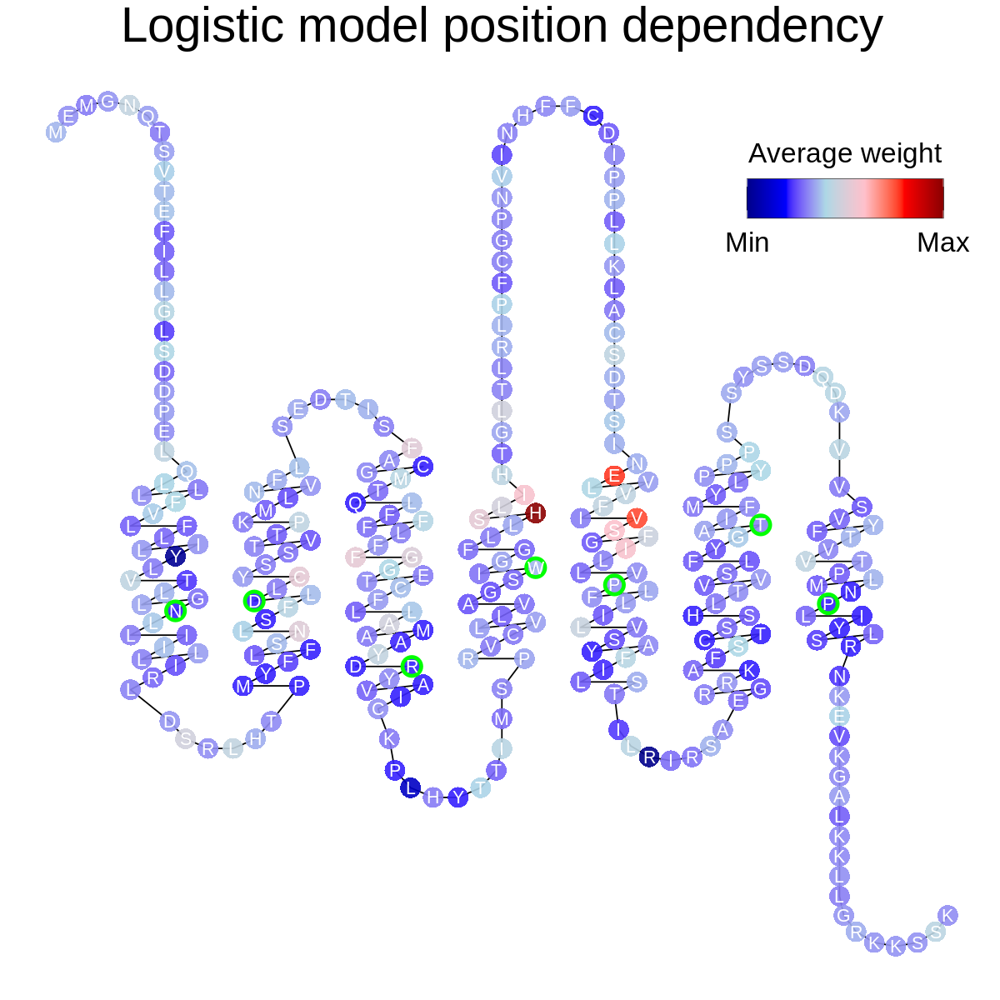

In [106]:
snakeplot_count_fig <- ggplot(snakeplot_df, aes(x = x, y= y, label=text, color = log_reg_weight_mean)) + 
    ggtitle("Logistic model position dependency") +
    geom_path(color = "black") +
    geom_point(size = 7, stroke = 0, alpha = 0.9) +
    geom_point(data = subset(snakeplot_df, BW != 0),
               aes(x = subset(snakeplot_df, BW != 0)$x, y = subset(snakeplot_df, BW != 0)$y),
               shape = 21, fill = NA, color = "green", size = 5, stroke = 2) +
    geom_text(hjust=0.5, vjust=0.5, color="white", size=6*0.75) +
    scale_color_gradientn(name = "Average weight", colors = c("dark blue","blue","light blue","pink","red","dark red"),
                          breaks = c(min(snakeplot_df$log_reg_weight_mean),max(snakeplot_df$log_reg_weight_mean)),
                          labels = c("Min","Max")) +
    theme(legend.position=c(.85,.85),
          legend.direction = "horizontal",
          legend.box = "vertical",
          legend.title = element_text(size=20),
          legend.text = element_text(size=20),
          legend.key.size = unit(1, 'cm'),
          axis.line=element_blank(),
          axis.text.x=element_blank(),
          axis.text.y=element_blank(),
          axis.ticks=element_blank(),
          axis.title.x=element_blank(),
          axis.title.y=element_blank(),
          panel.grid.major = element_blank(),
          panel.grid.minor = element_blank(),
          panel.background = element_blank(),
          plot.title= element_text(size = 35, hjust = 0.5)) +
    guides(colour = guide_colourbar(title.position="top", title.hjust = 0.5,
                                    frame.colour = "black", ticks.color = "black"),
           size = guide_legend(title.position="top", title.hjust = 0.5))

options(repr.plot.width=10, repr.plot.height=10)
snakeplot_count_fig
#ggsave("./plots/fig_4a_1.pdf", snakeplot_count_fig, height = 10, width = 10)

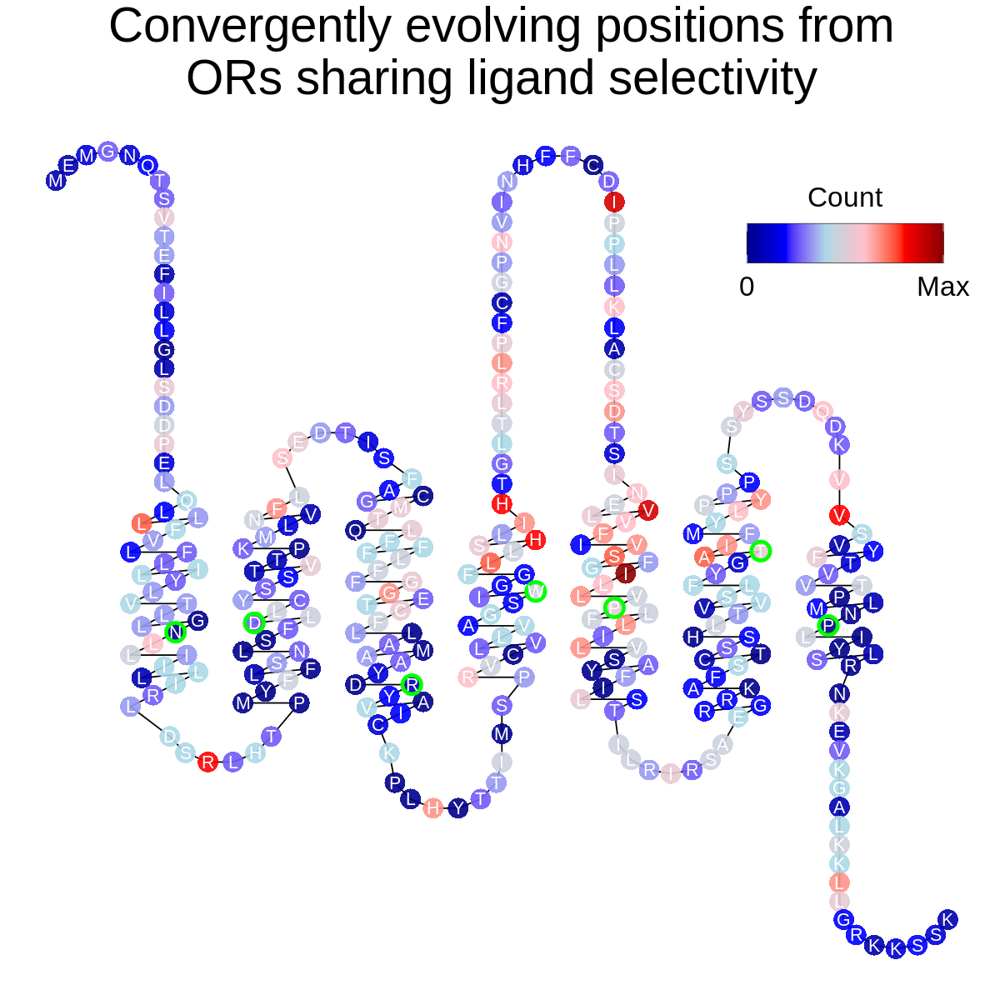

In [64]:
snakeplot_convEvol_fig <- ggplot(snakeplot_df, aes(x = x, y= y, label=text, color = conv_evol_sum)) + 
    ggtitle("Convergently evolving positions from\nORs sharing ligand selectivity") +
    geom_path(color = "black") +
    geom_point(size = 7, stroke = 0, alpha = 0.9) +
    geom_point(data = subset(snakeplot_df, BW != 0),
               aes(x = subset(snakeplot_df, BW != 0)$x, y = subset(snakeplot_df, BW != 0)$y),
               shape = 21, fill = NA, color = "green", size = 5, stroke = 2) +
    geom_text(hjust=0.5, vjust=0.5, color="white", size=6*0.75) +
    scale_color_gradientn(name = "Count", colors = c("dark blue","blue","light blue","pink","red","dark red"),
                          breaks = c(min(snakeplot_df$conv_evol_sum),max(snakeplot_df$conv_evol_sum)),
                          labels = c("0","Max")) +
    theme(legend.position=c(.85,.85),
          legend.direction = "horizontal",
          legend.box = "vertical",
          legend.title = element_text(size=20),
          legend.text = element_text(size=20),
          legend.key.size = unit(1, 'cm'),
          axis.line=element_blank(),
          axis.text.x=element_blank(),
          axis.text.y=element_blank(),
          axis.ticks=element_blank(),
          axis.title.x=element_blank(),
          axis.title.y=element_blank(),
          panel.grid.major = element_blank(),
          panel.grid.minor = element_blank(),
          panel.background = element_blank(),
          plot.title= element_text(size = 35, hjust = 0.5)) +
    guides(colour = guide_colourbar(title.position="top", title.hjust = 0.5, frame.colour = "black"),
           size = guide_legend(title.position="top", title.hjust = 0.5))

options(repr.plot.width=10, repr.plot.height=10)
snakeplot_convEvol_fig
#ggsave("./plots/fig_4e_1.pdf", snakeplot_convEvol_fig, height = 10, width = 10)

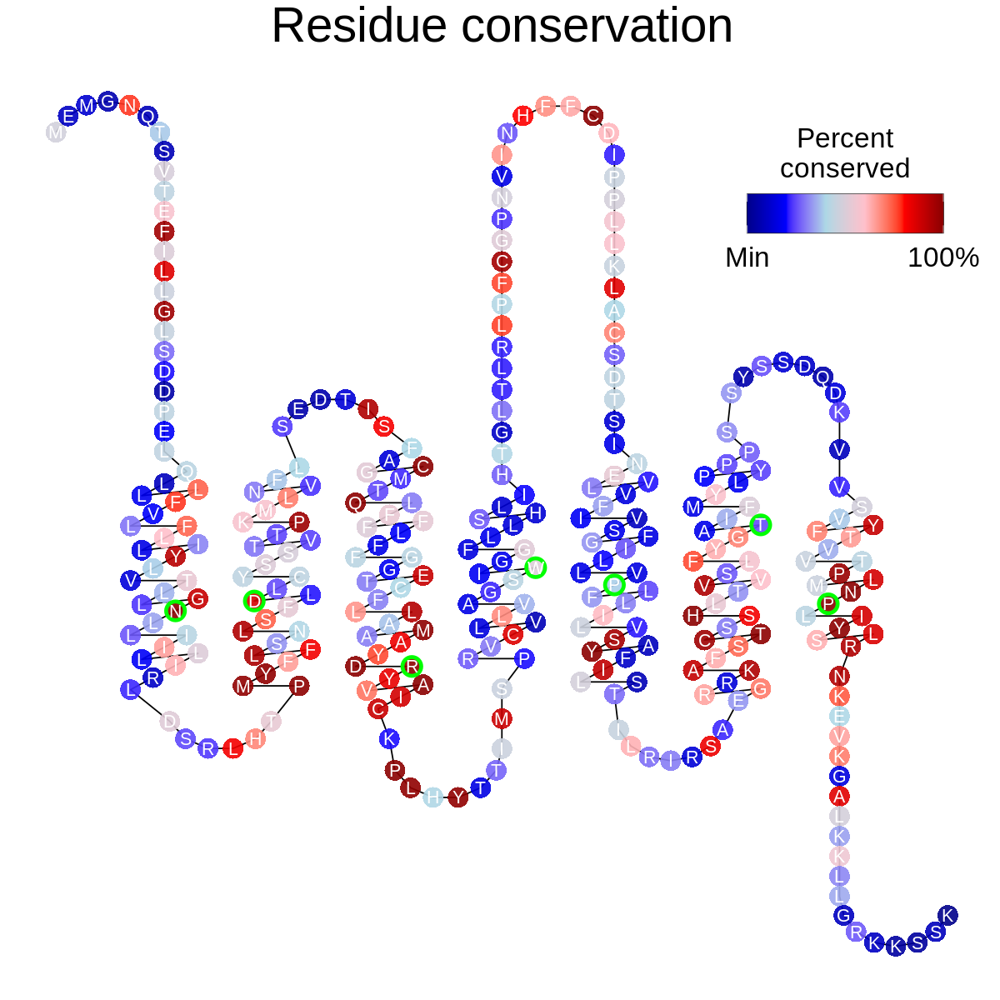

In [67]:
conservation_fig <- ggplot(snakeplot_df, aes(x = x, y= y, label=text, color = conservation)) + 
    ggtitle("Residue conservation") +
    geom_path(color = "black") +
    geom_point(size = 7, stroke = 0, alpha = 0.9) +
    geom_point(data = subset(snakeplot_df, BW != 0),
               aes(x = subset(snakeplot_df, BW != 0)$x, y = subset(snakeplot_df, BW != 0)$y),
               shape = 21, fill = NA, color = "green", size = 5, stroke = 2) +
    geom_text(hjust=0.5, vjust=0.5, color="white", size=6*0.75) +
    scale_color_gradientn(name = "Percent\nconserved", colors = c("dark blue","blue","light blue","pink","red","dark red"),
                          breaks = c(min(snakeplot_df$conservation),max(snakeplot_df$conservation)),
                          labels = c("Min","100%")) +
    theme(legend.position=c(.85,.85),
          legend.direction = "horizontal",
          legend.box = "vertical",
          legend.title = element_text(size=20),
          legend.text = element_text(size=20),
          legend.key.size = unit(1, 'cm'),
          axis.line=element_blank(),
          axis.text.x=element_blank(),
          axis.text.y=element_blank(),
          axis.ticks=element_blank(),
          axis.title.x=element_blank(),
          axis.title.y=element_blank(),
          panel.grid.major = element_blank(),
          panel.grid.minor = element_blank(),
          panel.background = element_blank(),
          plot.title= element_text(size = 35, hjust = 0.5)) +
    guides(colour = guide_colourbar(title.position="top", title.hjust = 0.5, frame.colour = "black"),
           size = guide_legend(title.position="top", title.hjust = 0.5))

options(repr.plot.width=10, repr.plot.height=10)
conservation_fig
#ggsave("./plots/fig_4b_1.pdf", conservation_fig, height = 10, width = 10)

`geom_smooth()` using formula 'y ~ x'



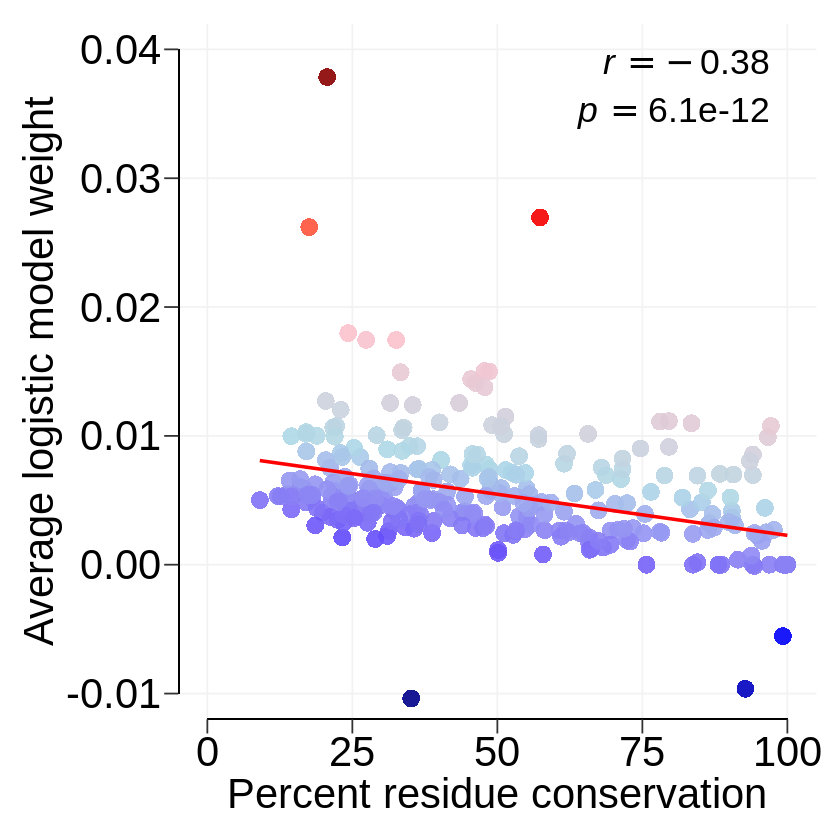

In [68]:
count_conservation_lm <- lm(log_reg_weight_mean ~ conservation, data = snakeplot_df)
snakeplot_df$weight_conservation_res <- count_conservation_lm$residuals
conserv_count_cor <- cor(snakeplot_df$conservation, snakeplot_df$log_reg_weight_mean)
conserv_count_pval <- cor.test(~conservation + log_reg_weight_mean, data = snakeplot_df)

conserv_count_compare <- ggplot(data = snakeplot_df, aes(x = conservation, y = log_reg_weight_mean, color = weight_conservation_res)) +
    geom_point(size = 5, stroke = 0, alpha = 0.9) +
    xlab("Percent residue conservation") +
    ylab("Average logistic model weight") +
    scale_x_continuous(breaks = seq(0,100,25),limits = c(-5,105), expand = c(0,0)) +
    scale_y_continuous(breaks = seq(-0.01,0.04,0.01),limits = c(-0.012,0.042), expand = c(0,0)) +
    geom_segment(aes(x = 0, xend = 100, y = -0.012, yend = -0.012), color = "black") +
    geom_segment(aes(x = -5, xend = -5, y = -0.01, yend = 0.04), color = "black") +
    scale_color_gradientn(colors = c("dark blue","blue","light blue","pink","red","dark red")) +
    theme(legend.position = "none",
          plot.background = element_blank(),
          panel.grid.major = element_line(color="gray95"),
          panel.grid.minor = element_blank(),
          panel.background = element_blank(),
          plot.title = element_text(size = 30, hjust = 0.5),
          panel.border = element_blank(),
          axis.line.x = element_blank(),
          axis.line.y = element_blank(),
          axis.text.x = element_text(color = "black", size = 25),
          axis.text.y = element_text(color = "black", size = 25),
          axis.title.x = element_text(color = "black", size = 25),
          axis.title.y = element_text(color = "black", size = 25),
          axis.ticks.length.x = unit(0.3, "cm"),
          axis.ticks.length.y = unit(0.3, "cm"),
          plot.margin = margin(t=0.5,r=0.5,b=0.5,l=0.5, "cm")) +
    geom_smooth(method=lm, color = "red", se=F) +
    annotate("text", x = 97, y = 0.039, label = paste("italic(r) ==",round(conserv_count_cor, digits = 2)), parse=T, size = 7.5, hjust = 1) +
    annotate("text", x = 97, y = 0.035, label = paste("italic(p) ==", signif(conserv_count_pval$p.value, digits = 2)), parse=TRUE, size = 7.5, hjust = 1)


options(repr.plot.width=7, repr.plot.height=7)
conserv_count_compare
#ggsave("./plots/fig_4c.pdf", conserv_count_compare, height = 7, width = 7)

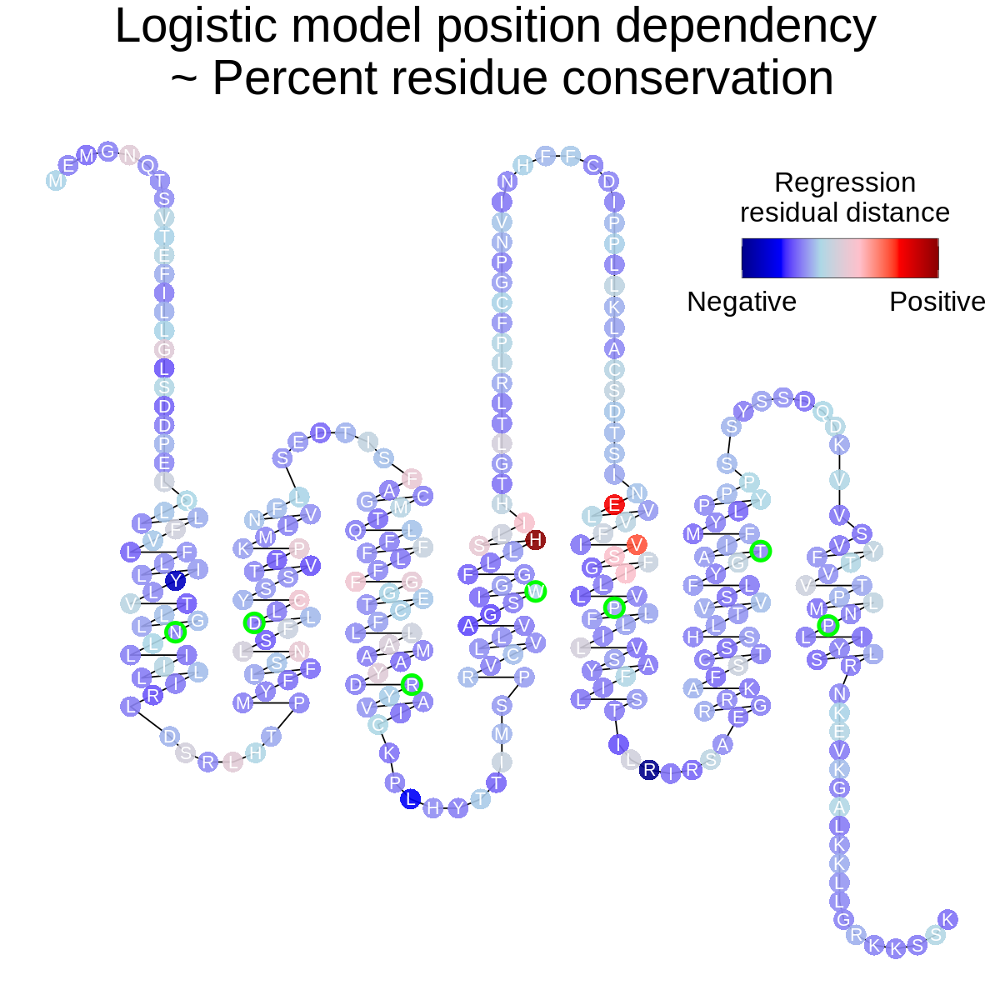

In [69]:
conserv_count_compare_snake <- ggplot(snakeplot_df, aes(x = x, y= y, label=text, color = weight_conservation_res)) + 
    ggtitle("Logistic model position dependency \n~ Percent residue conservation") +
    geom_path(color = "black") +
    geom_point(size = 7, stroke = 0, alpha = 0.9) +
    geom_point(data = subset(snakeplot_df, BW != 0),
               aes(x = subset(snakeplot_df, BW != 0)$x, y = subset(snakeplot_df, BW != 0)$y),
               shape = 21, fill = NA, color = "green", size = 5, stroke = 2) +
    geom_text(hjust=0.5, vjust=0.5, color="white", size=6*0.75) +
    scale_color_gradientn(name = "Regression\nresidual distance", colors = c("dark blue","blue","light blue","pink","red","dark red"),
                          breaks = c(min(snakeplot_df$weight_conservation_res),max(snakeplot_df$weight_conservation_res)),
                          labels = c("Negative","Positive")) +
    theme(legend.position=c(.85,.85),
          legend.direction = "horizontal",
          legend.box = "vertical",
          legend.title = element_text(size=20),
          legend.text = element_text(size=20),
          legend.key.size = unit(1, 'cm'),
          axis.line=element_blank(),
          axis.text.x=element_blank(),
          axis.text.y=element_blank(),
          axis.ticks=element_blank(),
          axis.title.x=element_blank(),
          axis.title.y=element_blank(),
          panel.grid.major = element_blank(),
          panel.grid.minor = element_blank(),
          panel.background = element_blank(),
          plot.title= element_text(size = 35, hjust = 0.5)) +
    guides(colour = guide_colourbar(title.position="top", title.hjust = 0.5, frame.colour = "black"),
           size = guide_legend(title.position="top", title.hjust = 0.5))

options(repr.plot.width=10, repr.plot.height=10)
conserv_count_compare_snake
#ggsave("./plots/fig_4_supp2c_2.pdf", conserv_count_compare_snake, height = 10, width = 10)

`geom_smooth()` using formula 'y ~ x'



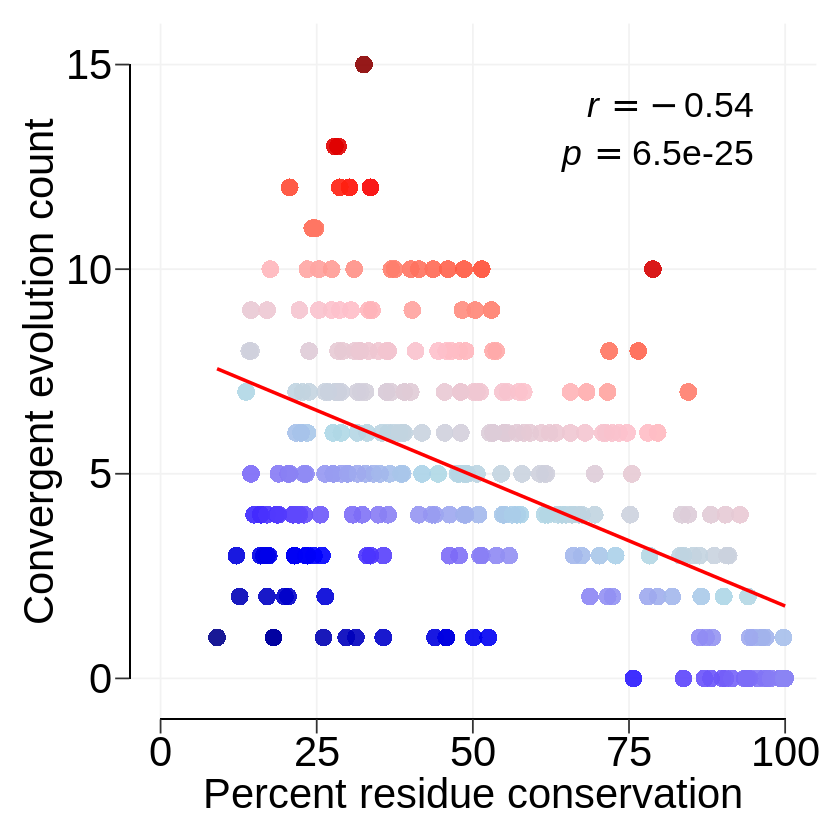

In [71]:
convevol_conservation_lm <- lm(conv_evol_sum ~ conservation, data = snakeplot_df)
snakeplot_df$convevol_conservation_res <- convevol_conservation_lm$residuals
conserv_convevol_cor <- cor(snakeplot_df$conservation, snakeplot_df$conv_evol_sum)
conserv_convevol_pval <- cor.test(~conservation + conv_evol_sum, data = snakeplot_df)

conserv_convevol_compare <- ggplot(data = snakeplot_df, aes(x = conservation, y = conv_evol_sum, color = convevol_conservation_res)) +
    geom_point(size = 5, stroke = 0, alpha = 0.9) +
    xlab("Percent residue conservation") +
    ylab("Convergent evolution count") +
    scale_x_continuous(breaks = seq(0,100,25),limits = c(-5,105), expand = c(0,0)) +
    scale_y_continuous(breaks = seq(0,15,5),limits = c(-1,16), expand = c(0,0)) +
    geom_segment(aes(x = 0, xend = 100, y = -1, yend = -1), color = "black") +
    geom_segment(aes(x = -5, xend = -5, y = 0, yend = 15), color = "black") +
    scale_color_gradientn(colors = c("dark blue","blue","light blue","pink","red","dark red")) +
    theme(legend.position = "none",
          plot.background = element_blank(),
          panel.grid.major = element_line(color="gray95"),
          panel.grid.minor = element_blank(),
          panel.background = element_blank(),
          plot.title = element_text(size = 30, hjust = 0.5),
          panel.border = element_blank(),
          axis.line.x = element_blank(),
          axis.line.y = element_blank(),
          axis.text.x = element_text(color = "black", size = 25),
          axis.text.y = element_text(color = "black", size = 25),
          axis.title.x = element_text(color = "black", size = 25),
          axis.title.y = element_text(color = "black", size = 25),
          axis.ticks.length.x = unit(0.3, "cm"),
          axis.ticks.length.y = unit(0.3, "cm"),
          plot.margin = margin(t=0.5,r=0.5,b=0.5,l=0.5, "cm")) +
    geom_smooth(method=lm, color = "red", se=F) +
    annotate("text", x = 95, y = 14, label = paste("italic(r) ==",round(conserv_convevol_cor, digits = 2)), parse=T, size = 7.5, hjust = 1) +
    annotate("text", x = 95, y = 12.75, label = paste("italic(p) ==", signif(conserv_convevol_pval$p.value, digits = 2)), parse=TRUE, size = 7.5, hjust = 1)

options(repr.plot.width=7, repr.plot.height=7)
conserv_convevol_compare
#ggsave("./plots/fig_4_supp2b_1.pdf", conserv_convevol_compare, height = 7, width = 7)

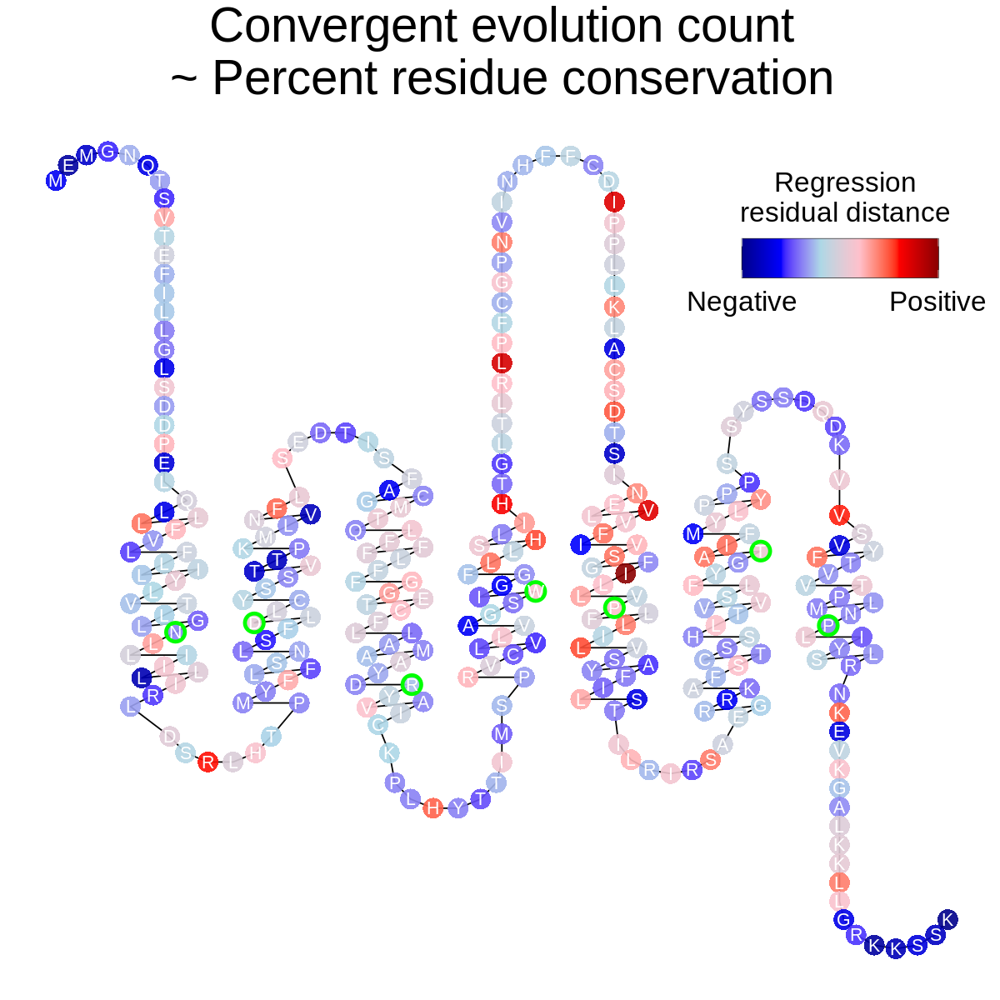

In [72]:
conserv_convevol_compare_snake <- ggplot(snakeplot_df, aes(x = x, y= y, label=text, color = convevol_conservation_res)) + 
    ggtitle("Convergent evolution count\n~ Percent residue conservation") +
    geom_path(color = "black") +
    geom_point(size = 7, stroke = 0, alpha = 0.9) +
    geom_point(data = subset(snakeplot_df, BW != 0),
               aes(x = subset(snakeplot_df, BW != 0)$x, y = subset(snakeplot_df, BW != 0)$y),
               shape = 21, fill = NA, color = "green", size = 5, stroke = 2) +
    geom_text(hjust=0.5, vjust=0.5, color="white", size=6*0.75) +
    scale_color_gradientn(name = "Regression\nresidual distance", colors = c("dark blue","blue","light blue","pink","red","dark red"),
                          breaks = c(min(snakeplot_df$convevol_conservation_res),max(snakeplot_df$convevol_conservation_res)),
                          labels = c("Negative","Positive")) +
    theme(legend.position=c(.85,.85),
          legend.direction = "horizontal",
          legend.box = "vertical",
          legend.title = element_text(size=20),
          legend.text = element_text(size=20),
          legend.key.size = unit(1, 'cm'),
          axis.line=element_blank(),
          axis.text.x=element_blank(),
          axis.text.y=element_blank(),
          axis.ticks=element_blank(),
          axis.title.x=element_blank(),
          axis.title.y=element_blank(),
          panel.grid.major = element_blank(),
          panel.grid.minor = element_blank(),
          panel.background = element_blank(),
          plot.title= element_text(size = 35, hjust = 0.5)) +
    guides(colour = guide_colourbar(title.position="top", title.hjust = 0.5, frame.colour = "black"),
           size = guide_legend(title.position="top", title.hjust = 0.5))

options(repr.plot.width=10, repr.plot.height=10)
conserv_convevol_compare_snake
#ggsave("./plots/fig_4_supp2b_2.pdf", conserv_convevol_compare_snake, height = 10, width = 10)

`geom_smooth()` using formula 'y ~ x'



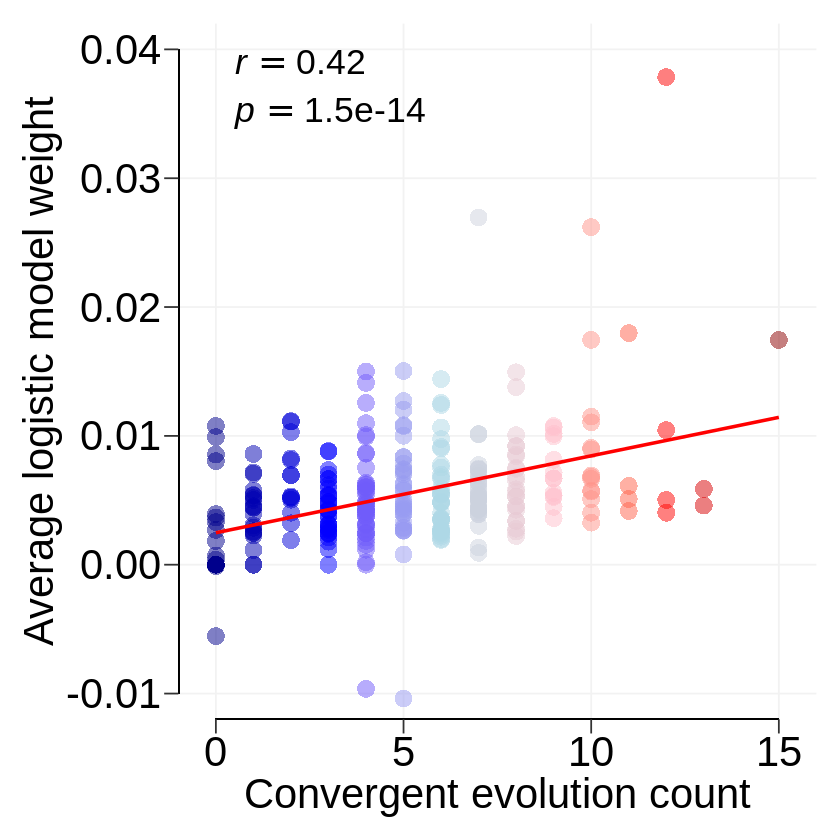

In [74]:
snakeplot_df$weight_convevol_mean <- rowMeans(snakeplot_df[,c("conv_evol_sum", "log_reg_weight_mean")])
count_convevol_cor <- cor(snakeplot_df$conv_evol_sum, snakeplot_df$log_reg_weight_mean)
count_convevol_pval <- cor.test(~log_reg_weight_mean + conv_evol_sum, data = snakeplot_df)


count_convevol_compare <- ggplot(data = snakeplot_df, aes(x = conv_evol_sum, y = log_reg_weight_mean, color = weight_convevol_mean)) +
    geom_point(size = 5, stroke = 0, alpha = 0.5) +
    xlab("Convergent evolution count") +
    ylab("Average logistic model weight") +
    scale_x_continuous(breaks = seq(0,15,5),limits = c(-1,16), expand = c(0,0)) +
    scale_y_continuous(breaks = seq(-0.01,0.04,0.01),limits = c(-0.012,0.042), expand = c(0,0)) +
    geom_segment(aes(x = 0, xend = 15, y = -0.012, yend = -0.012), color = "black") +
    geom_segment(aes(x = -1, xend = -1, y = -0.01, yend = 0.04), color = "black") +
    scale_color_gradientn(colors = c("dark blue","blue","light blue","pink","red","dark red")) +
    theme(legend.position = "none",
          plot.background = element_blank(),
          panel.grid.major = element_line(color="gray95"),
          panel.grid.minor = element_blank(),
          panel.background = element_blank(),
          plot.title = element_text(size = 30, hjust = 0.5),
          panel.border = element_blank(),
          axis.line.x = element_blank(),
          axis.line.y = element_blank(),
          axis.text.x = element_text(color = "black", size = 25),
          axis.text.y = element_text(color = "black", size = 25),
          axis.title.x = element_text(color = "black", size = 25),
          axis.title.y = element_text(color = "black", size = 25),
          axis.ticks.length.x = unit(0.3, "cm"),
          axis.ticks.length.y = unit(0.3, "cm"),
          plot.margin = margin(t=0.5,r=0.5,b=0.5,l=0.5, "cm")) +
    geom_smooth(method=lm, color = "red", se=F) +
    annotate("text", x = 0.5, y = 0.039, label = paste("italic(r) ==",round(count_convevol_cor, digits = 2)), parse=T, size = 7.5, hjust = 0) +
    annotate("text", x = 0.5, y = 0.035, label = paste("italic(p) ==", signif(count_convevol_pval$p.value, digits = 2)), parse=TRUE, size = 7.5, hjust = 0)

options(repr.plot.width=7, repr.plot.height=7)
count_convevol_compare
#ggsave("./plots/fig_4_supp2c_1.pdf", count_convevol_compare, height = 7, width = 7)

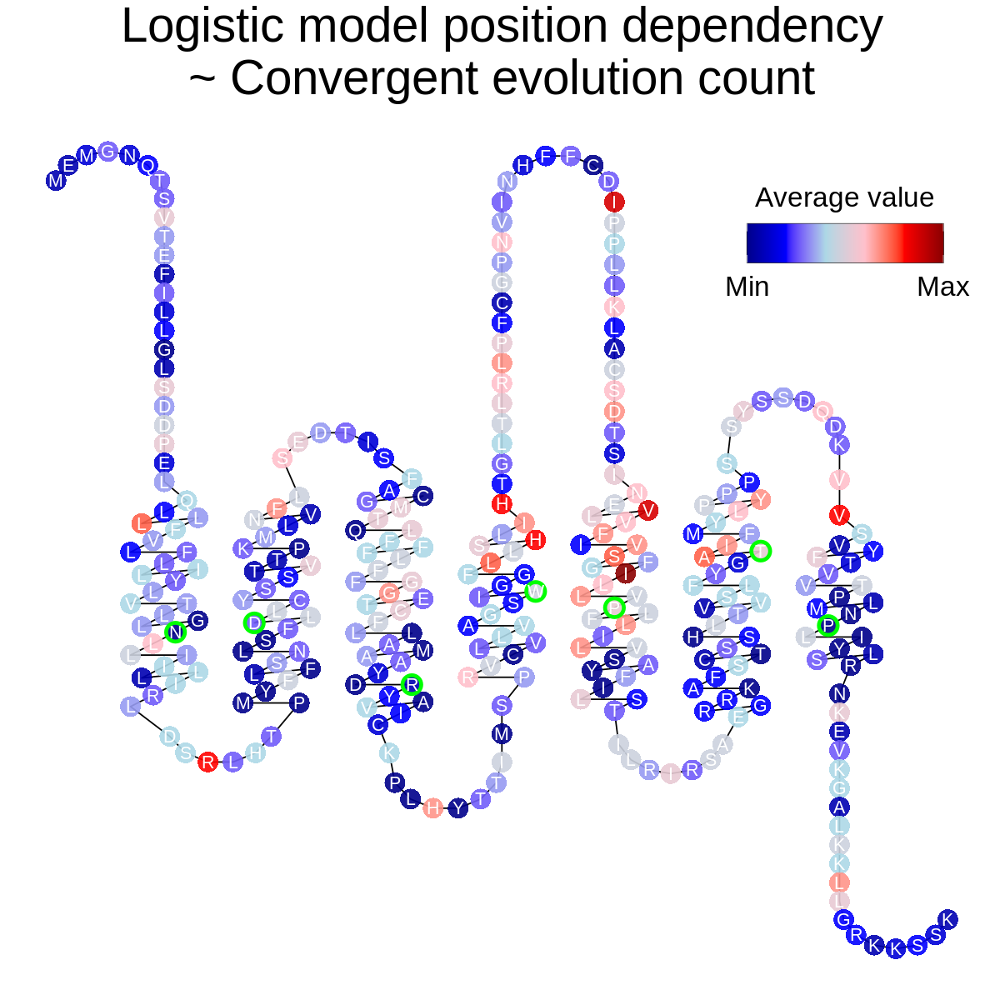

In [76]:
count_convevol_compare_snake <- ggplot(snakeplot_df, aes(x = x, y= y, label=text, color = weight_convevol_mean)) + 
    ggtitle("Logistic model position dependency\n~ Convergent evolution count") +
    geom_path(color = "black") +
    geom_point(size = 7, stroke = 0, alpha = 0.9) +
    geom_point(data = subset(snakeplot_df, BW != 0),
               aes(x = subset(snakeplot_df, BW != 0)$x, y = subset(snakeplot_df, BW != 0)$y),
               shape = 21, fill = NA, color = "green", size = 5, stroke = 2) +
    geom_text(hjust=0.5, vjust=0.5, color="white", size=6*0.75) +
    scale_color_gradientn(name = "Average value", colors = c("dark blue","blue","light blue","pink","red","dark red"),
                          breaks = c(min(snakeplot_df$weight_convevol_mean),max(snakeplot_df$weight_convevol_mean)),
                          labels = c("Min","Max")) +
    theme(legend.position=c(.85,.85),
          legend.direction = "horizontal",
          legend.box = "vertical",
          legend.title = element_text(size=20),
          legend.text = element_text(size=20),
          legend.key.size = unit(1, 'cm'),
          axis.line=element_blank(),
          axis.text.x=element_blank(),
          axis.text.y=element_blank(),
          axis.ticks=element_blank(),
          axis.title.x=element_blank(),
          axis.title.y=element_blank(),
          panel.grid.major = element_blank(),
          panel.grid.minor = element_blank(),
          panel.background = element_blank(),
          plot.title= element_text(size = 35, hjust = 0.5)) +
    guides(colour = guide_colourbar(title.position="top", title.hjust = 0.5, frame.colour = "black"),
           size = guide_legend(title.position="top", title.hjust = 0.5))

options(repr.plot.width=10, repr.plot.height=10)
count_convevol_compare_snake
#ggsave("./plots/fig_4_supp2c_2.pdf", count_convevol_compare_snake, height = 10, width = 10)

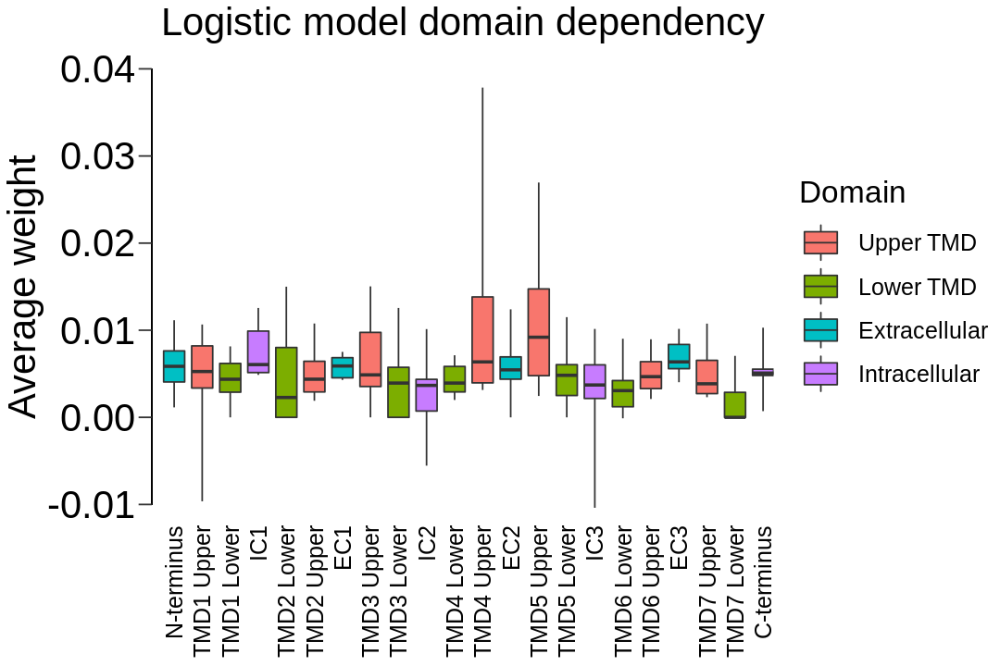

In [26]:
model_usage_box <- ggplot(data = snakeplot_df, aes(x = domain, y = log_reg_weight_mean)) +
    geom_boxplot(aes(fill = broad_domain), coef = 5000) +
    ggtitle("Logistic model domain dependency") +
    scale_fill_manual(name="Domain",
                      labels = c("Upper TMD","Lower TMD","Extracellular","Intracellular"),
                      values = c("#F8766D","#7CAE00","#00BFC4","#C77CFF")) +
    ylab("Average weight") +
    scale_x_discrete(expand = c(0,0)) +
    scale_y_continuous(breaks = seq(-0.01,0.04,0.01), limits = c(-0.012,0.042), expand = c(0,0)) +
    geom_segment(aes(x = 0.2, xend = 0.2, y = -0.01, yend = 0.04)) +
    theme(plot.background = element_blank(),
          panel.border = element_blank(),
          panel.grid.major = element_blank(),
          panel.grid.minor = element_blank(),
          panel.background = element_blank(),
          axis.line.x = element_blank(),
          axis.line.y = element_blank(),
          axis.text.x = element_text(color = "black", size = 15, angle = 90, hjust = 1, vjust = 0.5),
          axis.text.y = element_text(color = "black", size = 25),
          axis.title.x = element_blank(),
          axis.title.y = element_text(color = "black", size = 25),
          axis.ticks.length.x = unit(0, "cm"),
          axis.ticks.length.y = unit(0.3, "cm"),
          legend.title = element_text(size = 20),
          legend.text = element_text(size = 15),
          legend.key = element_blank(),
          legend.key.size = unit(1, 'cm'),
          plot.title= element_text(size = 25, hjust = 0.5))

options(repr.plot.width=9, repr.plot.height=6)
model_usage_box
#ggsave("./plots/fig_4a_2.pdf", model_usage_box, height = 6, width = 9)

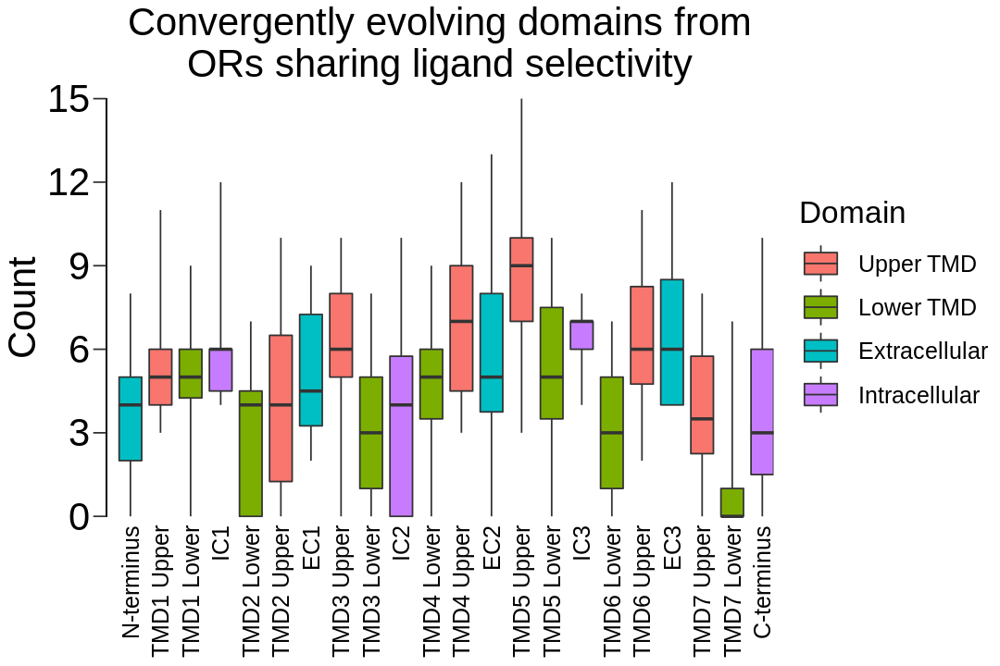

In [27]:
conv_evol_box <- ggplot(data = snakeplot_df, aes(x = domain, y = conv_evol_sum)) +
    geom_boxplot(aes(fill = broad_domain), coef = 5000) +
    ggtitle("Convergently evolving domains from\nORs sharing ligand selectivity") +
    scale_fill_manual(name="Domain",
                      labels = c("Upper TMD","Lower TMD","Extracellular","Intracellular"),
                      values = c("#F8766D","#7CAE00","#00BFC4","#C77CFF")) +
    ylab("Count") +
    scale_x_discrete(expand = c(0,0)) +
    scale_y_continuous(breaks = seq(0,15,3), limits = c(-0.2,15.2), expand = c(0,0)) +
    geom_segment(aes(x = 0.2, xend = 0.2, y = 0, yend = 15)) +
    theme(plot.background = element_blank(),
          panel.border = element_blank(),
          panel.grid.major = element_blank(),
          panel.grid.minor = element_blank(),
          panel.background = element_blank(),
          axis.line.x = element_blank(),
          axis.line.y = element_blank(),
          axis.text.x = element_text(color = "black", size = 15, angle = 90, hjust = 1, vjust = 0.5),
          axis.text.y = element_text(color = "black", size = 25),
          axis.title.x = element_blank(),
          axis.title.y = element_text(color = "black", size = 25),
          axis.ticks.length.x = unit(0, "cm"),
          axis.ticks.length.y = unit(0.3, "cm"),
          legend.title = element_text(size = 20),
          legend.text = element_text(size = 15),
          legend.key = element_blank(),
          legend.key.size = unit(1, 'cm'),
          plot.title= element_text(size = 25, hjust = 0.5))

options(repr.plot.width=9, repr.plot.height=6)
conv_evol_box
#ggsave("./plots/fig_4e_2.pdf", conv_evol_box, height = 6, width = 9)

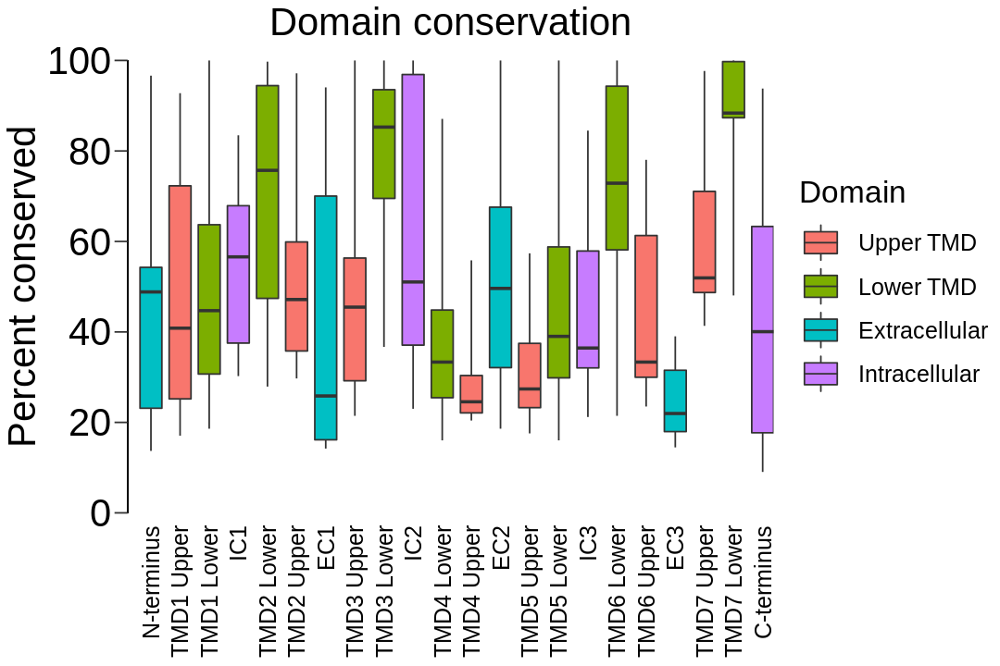

In [28]:
conserv_box <- ggplot(data = snakeplot_df, aes(x = domain, y = conservation)) +
    geom_boxplot(aes(fill = broad_domain), coef = 5000) +
    ggtitle("Domain conservation") +
    scale_fill_manual(name="Domain",
                      labels = c("Upper TMD","Lower TMD","Extracellular","Intracellular"),
                      values = c("#F8766D","#7CAE00","#00BFC4","#C77CFF")) +
    ylab("Percent conserved") +
    scale_x_discrete(expand = c(0,0)) +
    scale_y_continuous(breaks = seq(0,100,20), limits = c(-2,102), expand = c(0,0)) +
    geom_segment(aes(x = 0.2, xend = 0.2, y = 0, yend = 100)) +
    theme(plot.background = element_blank(),
          panel.border = element_blank(),
          panel.grid.major = element_blank(),
          panel.grid.minor = element_blank(),
          panel.background = element_blank(),
          axis.line.x = element_blank(),
          axis.line.y = element_blank(),
          axis.text.x = element_text(color = "black", size = 15, angle = 90, hjust = 1, vjust = 0.5),
          axis.text.y = element_text(color = "black", size = 25),
          axis.title.x = element_blank(),
          axis.title.y = element_text(color = "black", size = 25),
          axis.ticks.length.x = unit(0, "cm"),
          axis.ticks.length.y = unit(0.3, "cm"),
          legend.title = element_text(size = 20),
          legend.text = element_text(size = 15),
          legend.key = element_blank(),
          legend.key.size = unit(1, 'cm'),
          plot.title= element_text(size = 25, hjust = 0.5))

options(repr.plot.width=9, repr.plot.height=6)
conserv_box
#ggsave("./plots/fig_4b_2.pdf", conserv_box, height = 6, width = 9)

In [29]:
#write.csv(snakeplot_df, "./mouseOR_alignment/snakeplot_df.csv")
total_predictions <- do.call("rbind", model_predictions_lst)
row.names(total_predictions) <- NULL

total_predictions$ytest <- as.numeric(total_predictions$ytest)
total_predictions$lambda_min_pred <- as.numeric(total_predictions$lambda_min_pred)
total_predictions$lambda_1se_pred <- as.numeric(total_predictions$lambda_1se_pred)
total_predictions$odor_id <- as.numeric(total_predictions$odor_id)
total_predictions$iteration <- as.numeric(total_predictions$iteration)
total_predictions_roc_obj <- roc(total_predictions$ytest, total_predictions$lambda_1se_pred, levels = c(0,1), direction="<")
total_predictions_log_reg <- cbind.data.frame(fpr = 1 - total_predictions_roc_obj$specificities, tpr = total_predictions_roc_obj$sensitivities)


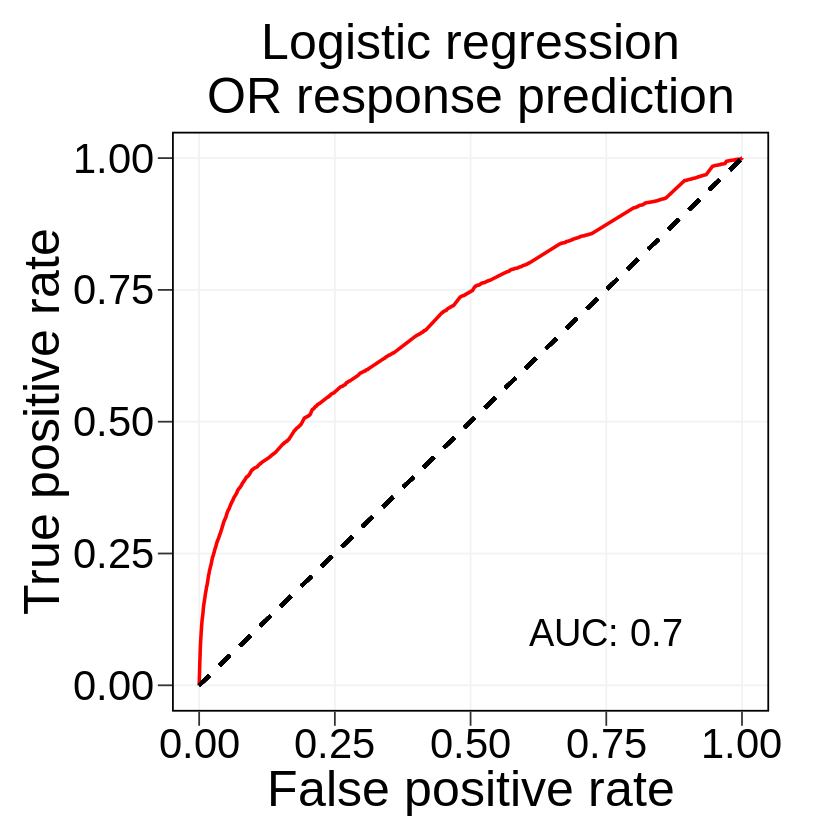

In [31]:
total_log_reg_plot <- ggplot(data = total_predictions_log_reg, aes(x = fpr, y = tpr)) +
    geom_path(color = "red", size = 1) +
    scale_x_continuous() +
    geom_segment(aes(x = 0, xend = 1, y = 0, yend = 1), color = "black", linetype = "dashed", size = 1) +
    xlab("False positive rate") +
    ylab("True positive rate") +
    ggtitle("Logistic regression\nOR response prediction") +
    theme(legend.position="none",
          legend.key=element_blank(),
          legend.title = element_text(size = 25),
          legend.text = element_text(size = 20),
          plot.background = element_blank(),
          plot.title = element_text(size = 30, hjust = 0.5),
          panel.border = element_rect(fill=NA, color="black", size = 1),
          panel.grid.major = element_line(color="gray95"),
          panel.grid.minor = element_blank(),
          panel.background = element_blank(),
          axis.line.x = element_blank(),
          axis.line.y = element_blank(),
          axis.text.x = element_text(color = "black", size = 25),
          axis.text.y = element_text(color = "black", size = 25),
          axis.title.x = element_text(color = "black", size = 30),
          axis.title.y = element_text(color = "black", size = 30),
          axis.ticks.length.x = unit(.3, "cm"),
          axis.ticks.length.y = unit(.3, "cm"),
          plot.margin = margin(t=0.5,r=1.5,b=0.5,l=0.5, "cm")) +
    annotate("text", size = 8, x = 0.75, y = 0.1, label = paste("AUC:",round(total_predictions_roc_obj$auc, digits = 2)))

options(repr.plot.width=7, repr.plot.height=7)
total_log_reg_plot

In [32]:
#Function to calculate AUC values
calc_tpr_fpr <- function(pred_df){
    pred_df$ytest <- as.numeric(pred_df$ytest)
    pred_df$lambda_1se_pred <- as.numeric(pred_df$lambda_1se_pred)
    pred_df$odor_id <- as.numeric(pred_df$odor_id)
    lambda_1se_roc_obj <- roc(pred_df$ytest, pred_df$lambda_1se_pred, levels=c(0,1), direction="<")
    odor_cid <- unique(pred_df$odor_id)
    out_df <- data.frame(cid = odor_cid, fpr = 1 - lambda_1se_roc_obj$specificities, tpr = lambda_1se_roc_obj$sensitivities)
    return(out_df)
}

In [33]:
log_reg_fpr_tpr <- lapply(model_predictions_lst, calc_tpr_fpr)
log_reg_fpr_tpr <- do.call("rbind", log_reg_fpr_tpr)
row.names(log_reg_fpr_tpr) <- NULL
log_reg_fpr_tpr$cid <- factor(log_reg_fpr_tpr$cid)
#write.csv(log_reg_fpr_tpr, "./mouseOR_alignment/logistic_regression_roc.csv")

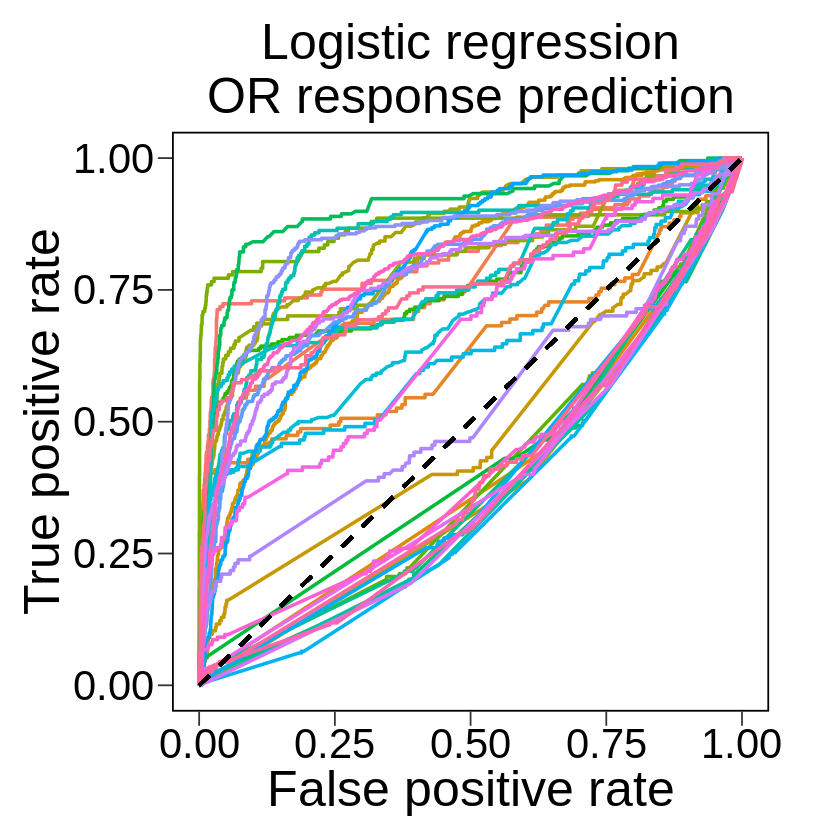

In [34]:
log_reg_ind_roc_plot <- ggplot(data = log_reg_fpr_tpr, aes(x = fpr, y = tpr, color = cid)) +
    geom_path(size = 1) +
    scale_x_continuous() +
    xlab("False positive rate") +
    ylab("True positive rate") +
    ggtitle("Logistic regression\nOR response prediction") +
    geom_segment(aes(x = 0, xend = 1, y = 0, yend = 1),
                 color = "black", linetype = "dashed", size = 1) +
    theme(legend.position = "none",
          legend.key=element_blank(),
          legend.title = element_text(size = 25),
          legend.text = element_text(size = 20),
          plot.background = element_blank(),
          plot.title = element_text(size = 30, hjust = 0.5),
          panel.border = element_rect(fill=NA, color="black", size = 1),
          panel.grid.major = element_blank(),
          panel.grid.minor = element_blank(),
          panel.background = element_blank(),
          axis.line.x = element_blank(),
          axis.line.y = element_blank(),
          axis.text.x = element_text(color = "black", size = 25),
          axis.text.y = element_text(color = "black", size = 25),
          axis.title.x = element_text(color = "black", size = 30),
          axis.title.y = element_text(color = "black", size = 30),
          axis.ticks.length.x = unit(.3, "cm"),
          axis.ticks.length.y = unit(.3, "cm"),
          plot.margin = margin(t=0.5,r=1.5,b=0.5,l=0.5, "cm"))

options(repr.plot.width=7, repr.plot.height=7)
log_reg_ind_roc_plot

In [35]:
#Load SVM data
linear_svm <- read.delim("./mouseOR_alignment/linear_svc_preds.csv", header=T, sep=',')
linear_svm <- linear_svm[,-1]
linear_svm_ls <- split(linear_svm, linear_svm$cid)

In [36]:
#Write function to generate ROCs
odor_roc <- function(df){
    df_roc <- roc(as.numeric(df$true), as.numeric(df$prediction), levels = c(0,1), direction = "<")
    df_roc_out <- cbind.data.frame(fpr = 1-df_roc$specificities,
                                   tpr = df_roc$sensitivities,
                                   cid = unique(df$cid),
                                   auc = unique(df_roc$auc))
    return(df_roc_out)
}

In [37]:
#Generate ROCs
svm_roc <- lapply(linear_svm_ls, odor_roc)
svm_roc <- do.call("rbind", svm_roc)
row.names(svm_roc) <- NULL

In [38]:
#svm_roc %>%
#    select(cid, auc) -> svm_auc_stats
#svm_auc_stats <- svm_auc_stats[!duplicated(svm_auc_stats),]
#row.names(svm_auc_stats) <- NULL
#write.csv(svm_auc_stats, "./mouseOR_alignment/linear_svc_auc.csv")

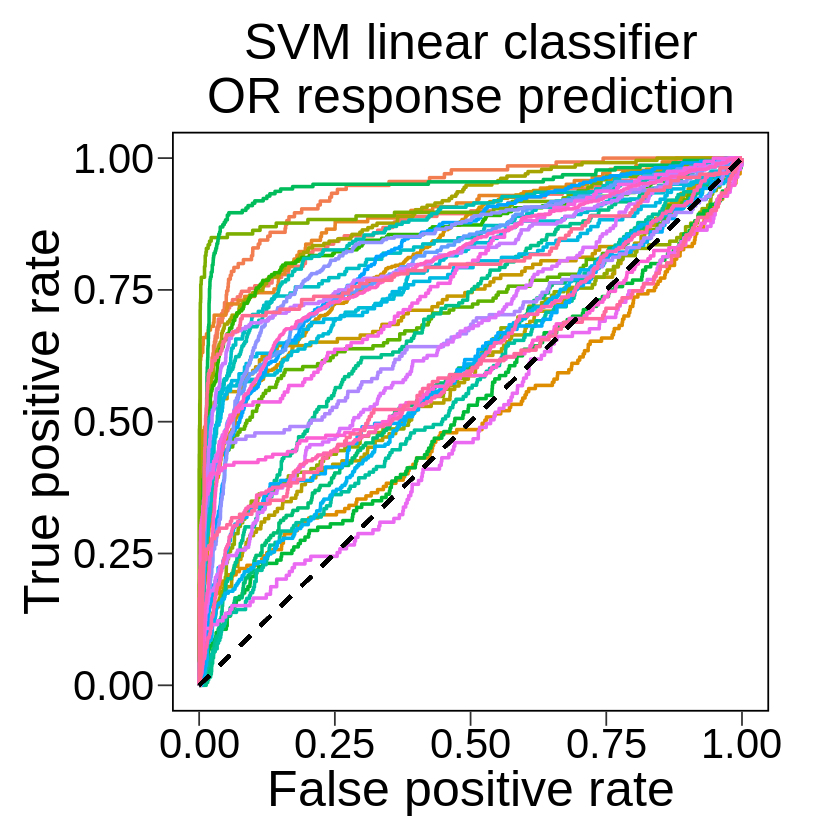

In [39]:
svm_ind_roc_plot <- ggplot(data = svm_roc, aes(x = fpr, y = tpr, color = factor(cid))) +
    geom_path(size = 1) +
    scale_x_continuous() +
    xlab("False positive rate") +
    ylab("True positive rate") +
    ggtitle("SVM linear classifier\nOR response prediction") +
    geom_segment(aes(x = 0, xend = 1, y = 0, yend = 1),
                 color = "black", linetype = "dashed", size = 1) +
    theme(legend.position = "none",
          legend.key=element_blank(),
          legend.title = element_text(size = 25),
          legend.text = element_text(size = 20),
          plot.background = element_blank(),
          plot.title = element_text(size = 30, hjust = 0.5),
          panel.border = element_rect(fill=NA, color="black", size = 1),
          panel.grid.major = element_blank(),
          panel.grid.minor = element_blank(),
          panel.background = element_blank(),
          axis.line.x = element_blank(),
          axis.line.y = element_blank(),
          axis.text.x = element_text(color = "black", size = 25),
          axis.text.y = element_text(color = "black", size = 25),
          axis.title.x = element_text(color = "black", size = 30),
          axis.title.y = element_text(color = "black", size = 30),
          axis.ticks.length.x = unit(.3, "cm"),
          axis.ticks.length.y = unit(.3, "cm"),
          plot.margin = margin(t=0.5,r=1.5,b=0.5,l=0.5, "cm"))

options(repr.plot.width=7, repr.plot.height=7)
svm_ind_roc_plot
#ggsave("./plots/fig_4_supp2a.pdf", svm_ind_roc_plot, height = 7, width = 7)

In [40]:
compiled_svm_roc <- roc(linear_svm$true, linear_svm$prediction, levels = c(0,1), direction = "<")
compiled_svm_ftpr <- cbind.data.frame(fpr = 1-compiled_svm_roc$specificities, tpr = compiled_svm_roc$sensitivities)

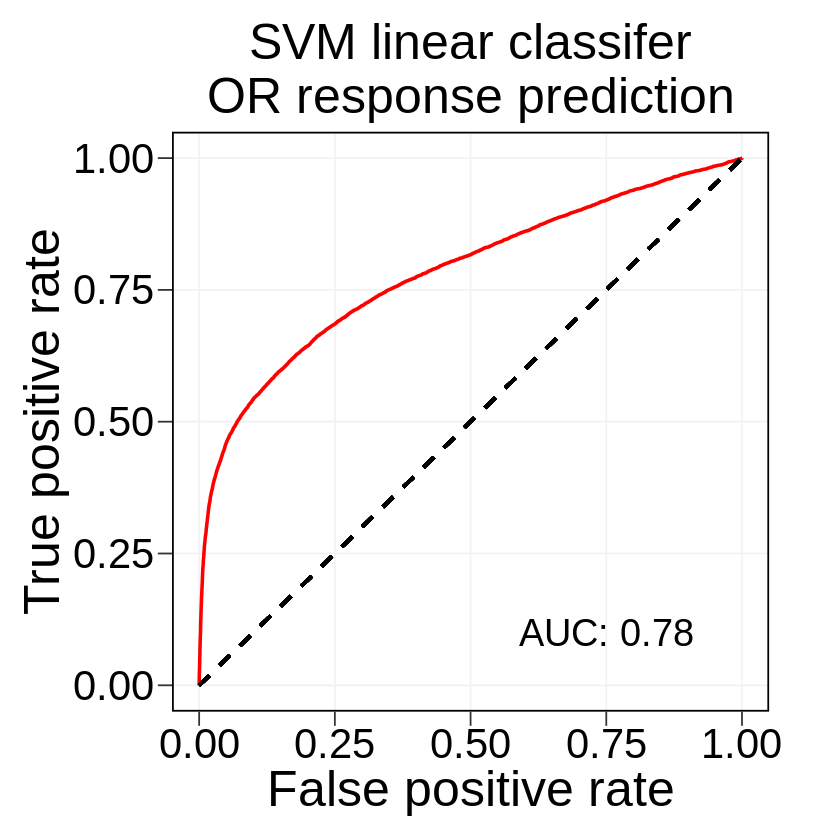

In [41]:
compiled_svm_roc_plot <- ggplot(data = compiled_svm_ftpr, aes(x = fpr, y = tpr)) +
    geom_path(color = "red", size = 1) +
    scale_x_continuous() +
    geom_segment(aes(x = 0, xend = 1, y = 0, yend = 1), color = "black", linetype = "dashed", size = 1) +
    xlab("False positive rate") +
    ylab("True positive rate") +
    ggtitle("SVM linear classifer\nOR response prediction") +
    theme(legend.position="none",
          legend.key=element_blank(),
          legend.title = element_text(size = 25),
          legend.text = element_text(size = 20),
          plot.background = element_blank(),
          plot.title = element_text(size = 30, hjust = 0.5),
          panel.border = element_rect(fill=NA, color="black", size = 1),
          panel.grid.major = element_line(color="gray95"),
          panel.grid.minor = element_blank(),
          panel.background = element_blank(),
          axis.line.x = element_blank(),
          axis.line.y = element_blank(),
          axis.text.x = element_text(color = "black", size = 25),
          axis.text.y = element_text(color = "black", size = 25),
          axis.title.x = element_text(color = "black", size = 30),
          axis.title.y = element_text(color = "black", size = 30),
          axis.ticks.length.x = unit(.3, "cm"),
          axis.ticks.length.y = unit(.3, "cm"),
          plot.margin = margin(t=0.5,r=1.5,b=0.5,l=0.5, "cm")) +
    annotate("text", size = 8, x = 0.75, y = 0.1, label = paste("AUC:",round(compiled_svm_roc$auc, digits = 2)))

options(repr.plot.width=7, repr.plot.height=7)
compiled_svm_roc_plot

In [42]:
total_predictions_log_reg$type <- "logistic"
compiled_svm_ftpr$type <- "svm"
log_svm_model_out <- rbind.data.frame(total_predictions_log_reg, compiled_svm_ftpr)

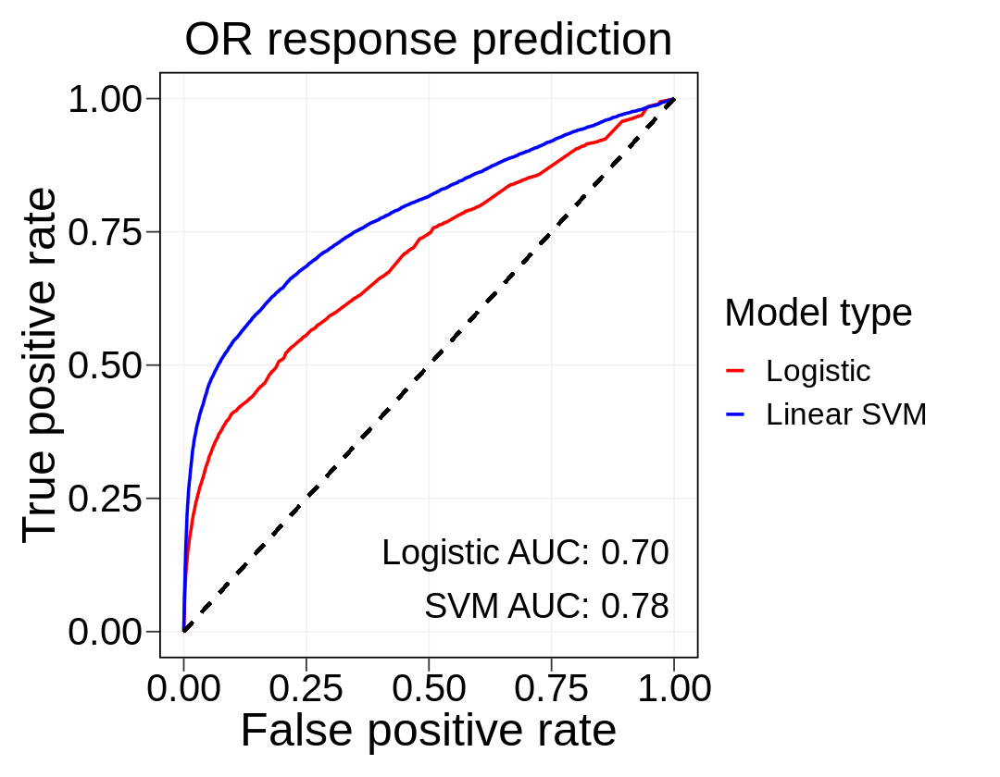

In [51]:
log_svm_model_plot <- ggplot(data = log_svm_model_out, aes(x = fpr, y = tpr, color = factor(type))) +
    geom_path(size = 1) +
    scale_x_continuous() +
    geom_segment(aes(x = 0, xend = 1, y = 0, yend = 1), color = "black", linetype = "dashed", size = 1) +
    xlab("False positive rate") +
    ylab("True positive rate") +
    ggtitle("OR response prediction") +
    scale_color_manual(name="Model type",
                       labels = c("Logistic","Linear SVM"),
                       values = c("red","blue")) +
    theme(legend.key=element_blank(),
          legend.title = element_text(size = 25),
          legend.key.size = unit(1, 'cm'),
          legend.text = element_text(size = 20),
          plot.background = element_blank(),
          plot.title = element_text(size = 30, hjust = 0.5),
          panel.border = element_rect(fill=NA, color="black", size = 1),
          panel.grid.major = element_line(color="gray95"),
          panel.grid.minor = element_blank(),
          panel.background = element_blank(),
          axis.line.x = element_blank(),
          axis.line.y = element_blank(),
          axis.text.x = element_text(color = "black", size = 25),
          axis.text.y = element_text(color = "black", size = 25),
          axis.title.x = element_text(color = "black", size = 30),
          axis.title.y = element_text(color = "black", size = 30),
          axis.ticks.length.x = unit(.3, "cm"),
          axis.ticks.length.y = unit(.3, "cm"),
          plot.margin = margin(t=0.5,r=1.5,b=0.5,l=0.5, "cm")) +
    #annotate("text", size = 8, x = 0.99, y = 0.15, hjust = 1, label = paste("Logistic AUC:",round(total_predictions_roc_obj$auc, digits = 2))) +
    annotate("text", size = 8, x = 0.99, y = 0.15, hjust = 1, label = paste("Logistic AUC:","0.70")) +
    annotate("text", size = 8, x = 0.99, y = 0.05, hjust = 1, label = paste("SVM AUC:",round(compiled_svm_roc$auc, digits = 2))) +
    guides(color = guide_legend(override.aes = list(size = 1, alpha = 1), keywidth = 1))

options(repr.plot.width=9, repr.plot.height=7)
log_svm_model_plot
#ggsave("./plots/fig_4d.pdf", log_svm_model_plot, height = 7, width = 9)

# Odor specific logistic regression data & plots

In [77]:
#Function to split position aa column
split_paa <- function(input_df){
    split_names <- str_split_fixed(input_df$position_aa, "_", 2)
    output_df <- cbind.data.frame(split_names, input_df)
    colnames(output_df)[1:2] <- c("position","aa")
    output_df$position <- as.numeric(output_df$position)
    output_df$cid <- as.numeric(output_df$cid)
    return(output_df)
}

#Function to calculate stats
calc_weights_stats <- function(input_df){
    input_df %>%
        subset(weights != 0) %>%
        group_by(position) %>%
        summarise(count = n(), sum = sum(weights), avg = mean(weights)) %>%
        arrange(position) -> output_df
    return(output_df)
}

In [78]:
#Calculate stats for amino acid weights
model_1se_stats <- lapply(model_1se_weights, split_paa)
model_1se_stats <- do.call("rbind", model_1se_stats)
sig_model_1se_stats <- subset(model_1se_stats, cid %in% sig_predictions$cid)
row.names(sig_model_1se_stats) <- NULL
sig_model_1se_stats <- split(sig_model_1se_stats, sig_model_1se_stats$cid)
sig_model_1se_stats <- lapply(sig_model_1se_stats, calc_weights_stats)
#Load data with amino acid identity info
log_reg_common_aa <- read.delim("./mouseOR_alignment/common_aa_from_logReg.csv", header=T, sep=',', row.names = 1)
log_reg_common_aa <- split(log_reg_common_aa, log_reg_common_aa$cid)
#Load predictions
all_predictions_1se <- do.call("rbind", model_predictions_lst)
sig_predictions_1se <- subset(all_predictions_1se, odor_id %in% sig_predictions$cid)
sig_predictions_1se <- split(sig_predictions_1se, sig_predictions_1se$odor_id)
#Load odornames
cid_odornames <- read.delim("./cid_info/cid_odornames.csv", header=T, sep=',', row.names = 1)
#Load logistic regression pS6 data long format
log_reg_ps6 <- read.delim("./compiled_desc_resp/log_reg_compiled_ps6_data.csv", header=T, sep=',', row.names = 1)
log_reg_ps6 <- subset(log_reg_ps6, cid %in% sig_predictions$cid)
log_reg_ps6_ls <- split(log_reg_ps6, log_reg_ps6$cid)

In [79]:
for (cid in names(sig_model_1se_stats)){
    stats_df <- sig_model_1se_stats[[cid]]
    info_df <- log_reg_common_aa[[cid]]
    row.names(info_df) <- NULL
    for (position in info_df$position){
        if (position %in% stats_df$position){
            index <- which(stats_df$position == position)
            count_val <- stats_df[index,"count"]
            sum_val <- stats_df[index,"sum"]
            avg_val <- stats_df[index,"avg"]
            info_df[position,"count_val"] <- avg_val
            info_df[position,"sum_val"] <- sum_val
            info_df[position,"avg_val"] <- avg_val
        } else {
            info_df[position,"count_val"] <- 0
            info_df[position,"sum_val"] <- 0
            info_df[position,"avg_val"] <- 0
        }
    }
    info_df$x <- snakeplot_df$x
    info_df$y <- snakeplot_df$y
    info_df$domain <- snakeplot_df$domain
    info_df$broad_domain <- snakeplot_df$broad_domain
    info_df$BW <- snakeplot_df$BW
    assign(paste0("snakeplot_",cid),
        ggplot(info_df, aes(x = x, y= y, label=text, color = avg_val)) + 
        ggtitle(paste0("Logistic model position dependency\n",
                       unique(cid_odornames[cid_odornames$cid == cid,]$name))) +
        geom_path(color = "black") +
        geom_point(size = 7, stroke = 0, alpha = 0.9) +
        geom_point(data = subset(snakeplot_df, BW != 0),
                   aes(x = subset(snakeplot_df, BW != 0)$x, y = subset(snakeplot_df, BW != 0)$y),
                   shape = 21, fill = NA, color = "green", size = 5, stroke = 2) +
        geom_text(hjust=0.5, vjust=0.5, color="white", size=6*0.75) +
        scale_color_gradientn(name = "Average weight", colors = c("dark blue","blue","light blue","pink","red","dark red"),
                              breaks = c(min(info_df$avg_val),max(info_df$avg_val)),
                              labels = c("Min","Max")) +
        #geom_point(data = subset(info_df, domain == "TMD4 Upper"),
        #           shape = 1, size = 6, stroke = 1,
        #           color = "green") +
        #geom_point(data = subset(info_df, domain == "TMD5 Upper"),
        #           shape = 1, size = 6, stroke = 1,
        #           color = "purple") +
        theme(legend.position=c(.85,.85),
              legend.direction = "horizontal",
              legend.box = "vertical",
              legend.title = element_text(size=20),
              legend.text = element_text(size=20),
              legend.key.size = unit(1, 'cm'),
              axis.line=element_blank(),
              axis.text.x=element_blank(),
              axis.text.y=element_blank(),
              axis.ticks=element_blank(),
              axis.title.x=element_blank(),
              axis.title.y=element_blank(),
              panel.grid.major = element_blank(),
              panel.grid.minor = element_blank(),
              panel.background = element_blank(),
              plot.title= element_text(size = 35, hjust = 0.5)) +
        guides(colour = guide_colourbar(title.position="top", title.hjust = 0.5, frame.colour = "black"),
               size = guide_legend(title.position="top", title.hjust = 0.5))
    )
    preds_df <- sig_predictions_1se[[cid]]
    preds_df$ytest <- as.numeric(preds_df$ytest)
    preds_df$lambda_1se_pred <- as.numeric(preds_df$lambda_1se_pred)
    preds_df$odor_id <- as.numeric(preds_df$odor_id)
    preds_df$iteration <- as.numeric(preds_df$iteration)
    roc_obj <- roc(preds_df$ytest, preds_df$lambda_1se_pred, levels = c(0,1), direction="<")
    roc_df <- data.frame(fpr = 1 - roc_obj$specificities, tpr = roc_obj$sensitivities)
    assign(paste0("rocplot_",cid),
        ggplot(roc_df, aes(x = fpr, y = tpr)) +
        geom_path(color = "red", size = 1) +
        geom_segment(aes(x = 0, xend = 1, y = 0, yend = 1), color = "black", linetype = "dashed", size = 1) +
        xlab("False positive rate") +
        ylab("True positive rate") +
        ggtitle(paste0("OR response prediction\n",
                       unique(cid_odornames[cid_odornames$cid == cid,]$name))) +
        theme(legend.position="none",
              legend.key=element_blank(),
              legend.title = element_text(size = 25),
              legend.text = element_text(size = 20),
              plot.background = element_blank(),
              plot.title = element_text(size = 30, hjust = 0.5),
              panel.border = element_rect(fill=NA, color="black", size = 1),
              panel.grid.major = element_line(color="gray95"),
              panel.grid.minor = element_blank(),
              panel.background = element_blank(),
              axis.line.x = element_blank(),
              axis.line.y = element_blank(),
              axis.text.x = element_text(color = "black", size = 25),
              axis.text.y = element_text(color = "black", size = 25),
              axis.title.x = element_text(color = "black", size = 30),
              axis.title.y = element_text(color = "black", size = 30),
              axis.ticks.length.x = unit(.3, "cm"),
              axis.ticks.length.y = unit(.3, "cm"),
              plot.margin = margin(t=0.5,r=1.5,b=0.5,l=0.5, "cm")) +
           annotate("text", size = 8, x = 0.95, y = 0.05, hjust = 1, label = paste("AUC:",round(roc_obj$auc, digits = 2))))
    ps6_dat <- log_reg_ps6_ls[[cid]]
    assign(paste0("volplot_",cid),
           ggplot(ps6_dat, aes(x = logFC, y = -log10(FDR))) +
           geom_point(size = 5, stroke = 0, alpha = 0.75, color = "gray75") + 
           geom_point(data = subset(ps6_dat, FDR < 0.05 & logFC > 0), size = 5, stroke = 0, alpha = 1, color = "red") + 
           geom_vline(xintercept = 0, size = 1) +
           geom_hline(yintercept = 0, size = 1) +
           geom_hline(yintercept = -log10(0.05), color = "red", linetype = "dashed", size = 1) +
           ggtitle(paste(paste(unique(cid_odornames[cid_odornames$cid == cid,]$conc), unique(cid_odornames[cid_odornames$cid == cid,]$name)),"\npS6-IP-Seq, Olfr only")) +
           xlab(expression(log[2](fold~change))) +
           ylab(expression(-log[10](FDR))) +
           theme(legend.position = "none",
                 plot.title = element_text(size = 30, hjust = 0.5, color = "black"),
                 plot.background = element_blank(),
                 panel.border = element_blank(),
                 panel.grid.major = element_line(color="gray95"),
                 panel.grid.minor = element_blank(),
                 panel.background = element_blank(),
                 axis.line.x = element_blank(),
                 axis.line.y = element_blank(),
                 axis.text.x = element_text(color = "black", size = 25),
                 axis.text.y = element_text(color = "black", size = 25),
                 axis.title.x = element_text(color = "black", size = 25),
                 axis.title.y = element_text(color = "black", size = 25),
                 axis.ticks.length.x = unit(0, "cm"),
                 axis.ticks.length.y = unit(0, "cm"),
                 plot.margin = margin(t=0.5,r=0.5,b=0.5,l=0.5, "cm")))
}

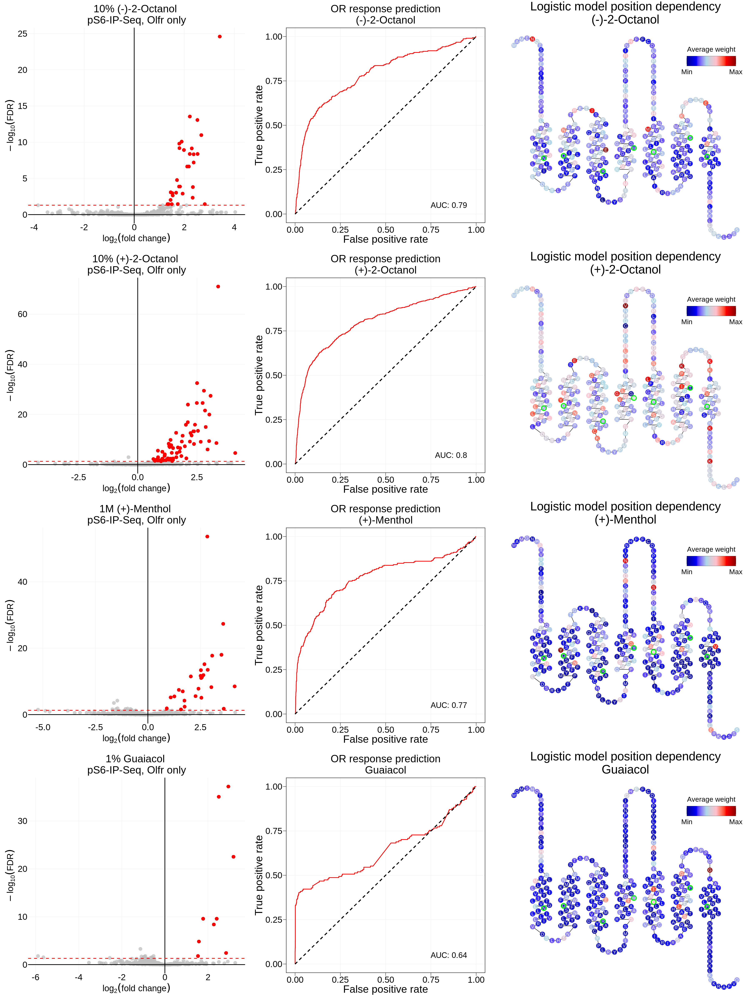

In [81]:
options(repr.plot.width=30, repr.plot.height=40)
alcohols_log_reg <- ggarrange(volplot_80080, rocplot_80080, snakeplot_80080, volplot_2723888, rocplot_2723888, snakeplot_2723888, volplot_165675, rocplot_165675, snakeplot_165675, volplot_460, rocplot_460, snakeplot_460,
                              ncol = 3, nrow = 4)
alcohols_log_reg
#ggsave("./plots/fig_4_supp1a_1.pdf", alcohols_log_reg, height = 40, width = 30, limitsize = FALSE)

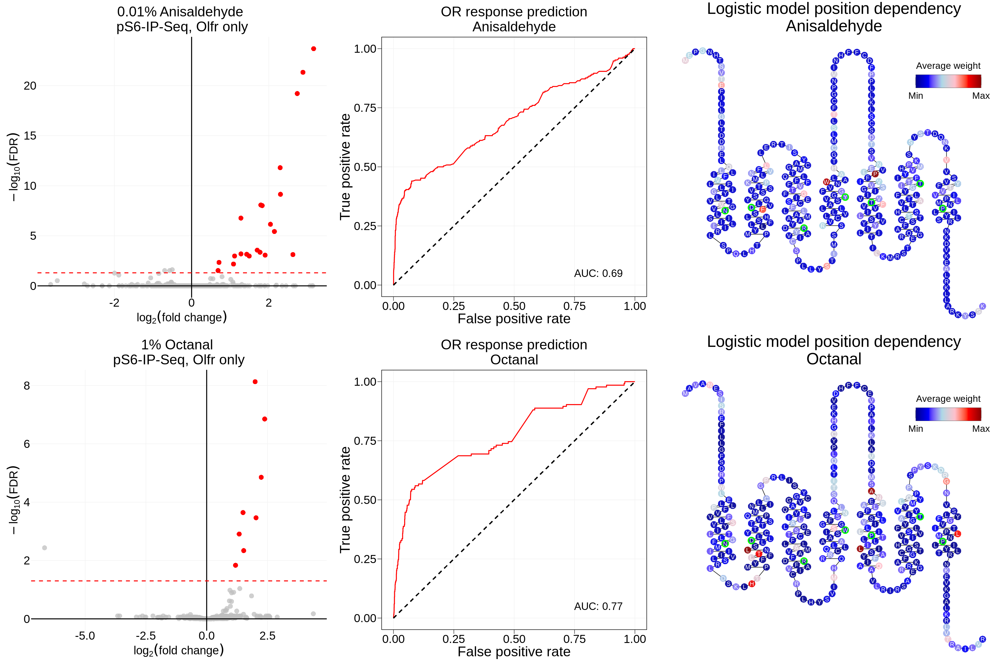

In [82]:
options(repr.plot.width=30, repr.plot.height=20)
aldehyde_log_reg <- ggarrange(volplot_31244, rocplot_31244, snakeplot_31244, volplot_454, rocplot_454, snakeplot_454,
                              ncol = 3, nrow = 2)
aldehyde_log_reg
#ggsave("./plots/fig_4_supp1a_2.pdf", aldehyde_log_reg, height = 20, width = 30, limitsize = FALSE)

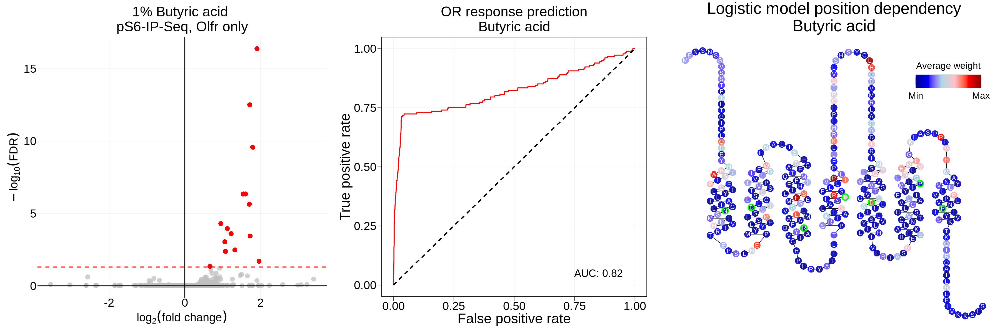

In [83]:
options(repr.plot.width=30, repr.plot.height=10)
carb_acid_log_reg <- ggarrange(volplot_264, rocplot_264, snakeplot_264,
                               ncol = 3, nrow = 1)
carb_acid_log_reg
#ggsave("./plots/fig_4_supp1a_3.pdf", carb_acid_log_reg, height = 10, width = 30, limitsize = FALSE)

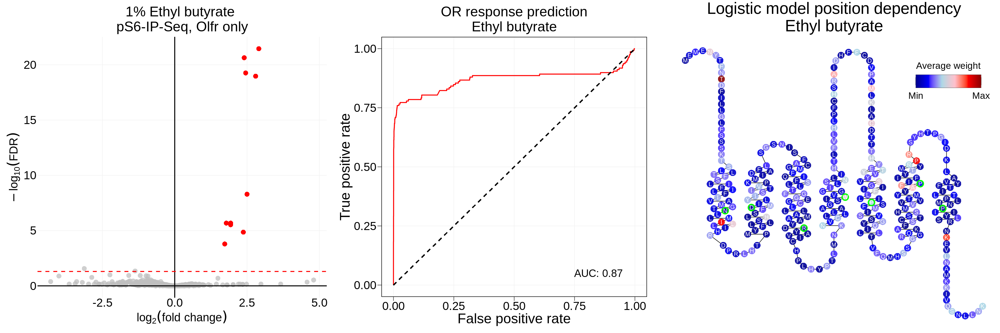

In [84]:
options(repr.plot.width=30, repr.plot.height=10)
esters_log_reg <- ggarrange(volplot_7762, rocplot_7762, snakeplot_7762, 
                            ncol =3, nrow = 1)
esters_log_reg
#ggsave("./plots/fig_4_supp1a_4.pdf", esters_log_reg, height = 10, width = 30, limitsize = FALSE)

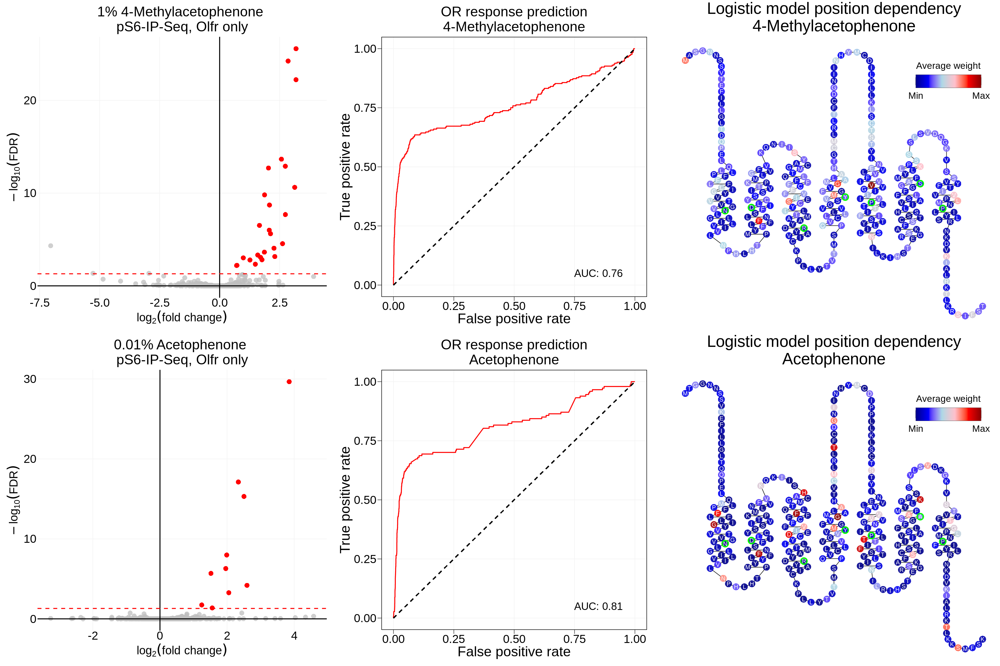

In [85]:
options(repr.plot.width=30, repr.plot.height=20)
ketone_log_reg <- ggarrange(volplot_8500, rocplot_8500, snakeplot_8500, volplot_7410, rocplot_7410, snakeplot_7410, 
                            ncol = 3, nrow = 2)
ketone_log_reg
#ggsave("./plots/fig_4_supp1a_5.pdf", ketone_log_reg, height = 20, width = 30, limitsize = FALSE)

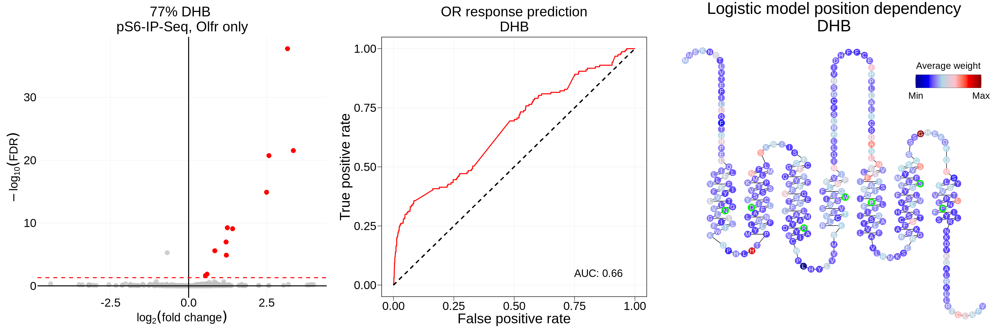

In [86]:
options(repr.plot.width=30, repr.plot.height=10)
others_log_reg <- ggarrange(volplot_536095, rocplot_536095, snakeplot_536095,
                            nrow =1 , ncol = 3)
others_log_reg
#ggsave("./plots/fig_4_supp1a_6.pdf", others_log_reg, height = 10, width = 30, limitsize = FALSE)

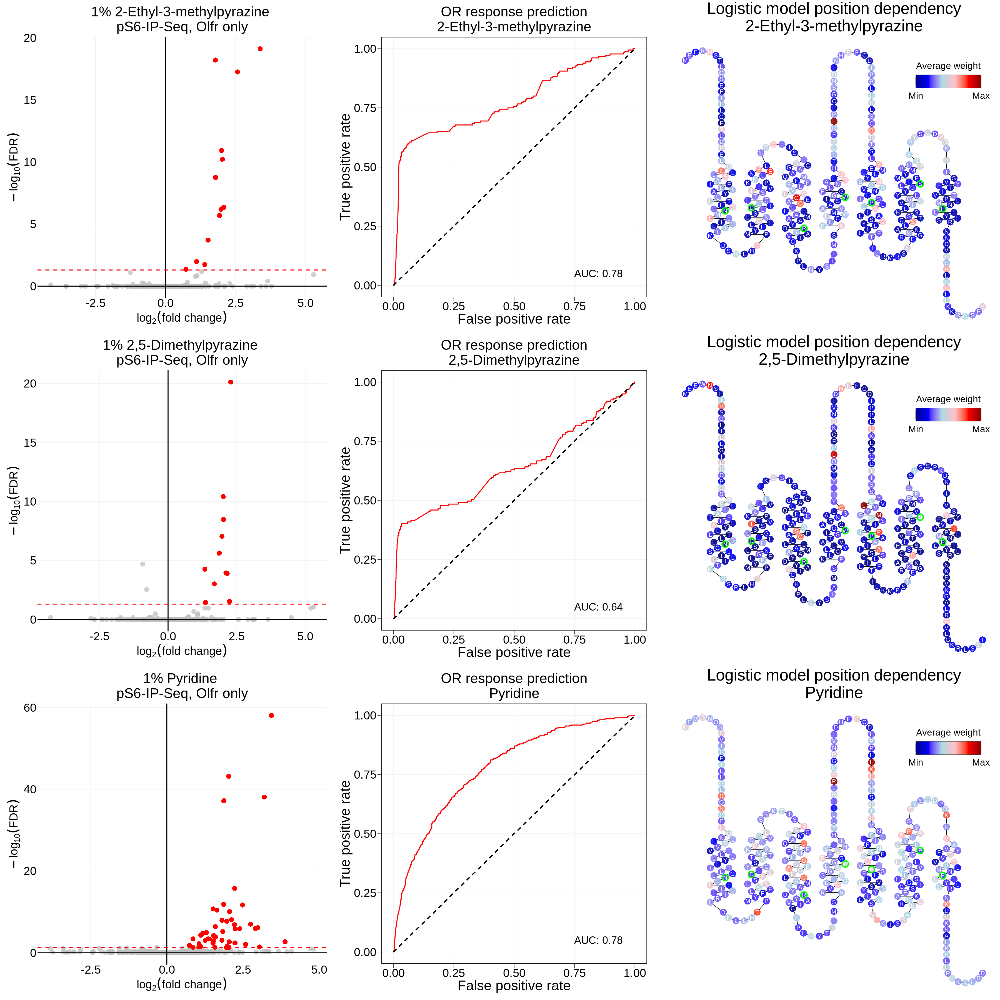

In [87]:
options(repr.plot.width=30, repr.plot.height=30)
pyr_log_reg <- ggarrange(volplot_27457, rocplot_27457, snakeplot_27457,volplot_31252, rocplot_31252, snakeplot_31252, volplot_1049, rocplot_1049, snakeplot_1049,
                         ncol = 3, nrow = 3)
pyr_log_reg
#ggsave("./plots/fig_4_supp1a_7.pdf", pyr_log_reg, height = 30, width = 30, limitsize = FALSE)

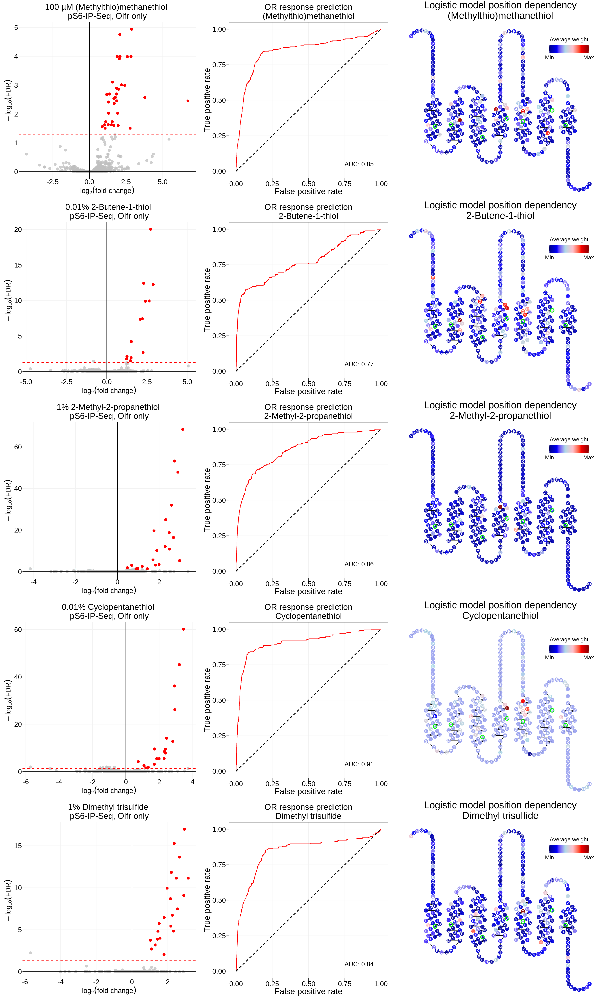

In [88]:
options(repr.plot.width=30, repr.plot.height=50)
sulf_log_reg <- ggarrange(volplot_122370, rocplot_122370, snakeplot_122370,volplot_6433451, rocplot_6433451, snakeplot_6433451, volplot_6387, rocplot_6387, snakeplot_6387, volplot_15510, rocplot_15510, snakeplot_15510, volplot_19310, rocplot_19310, snakeplot_19310, 
                          ncol = 3, nrow = 5)
sulf_log_reg
#ggsave("./plots/fig_4_supp1a_8.pdf", sulf_log_reg, height = 50, width = 30, limitsize = FALSE)

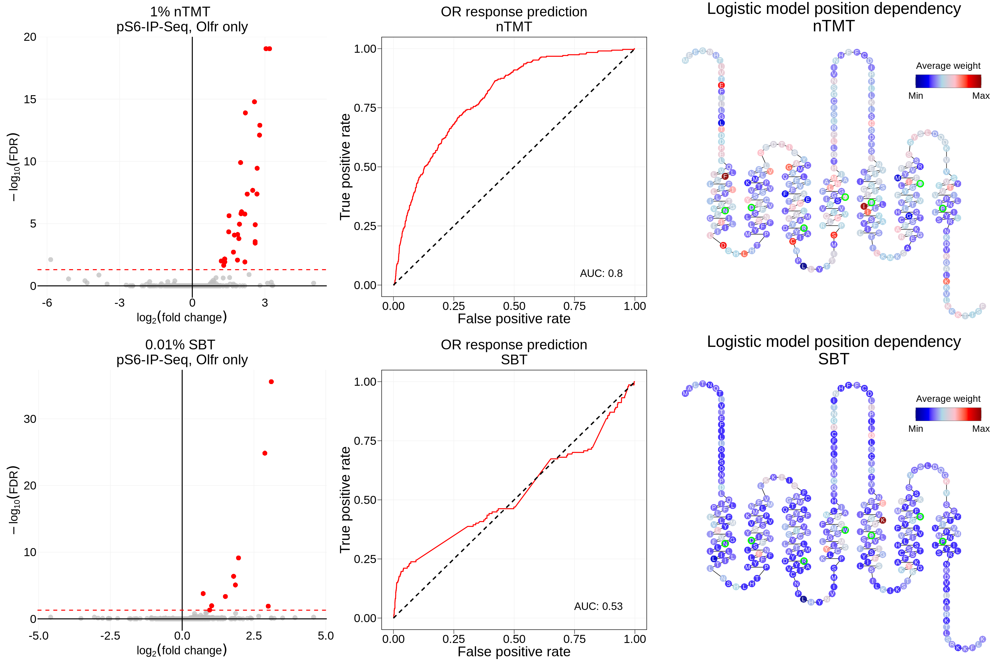

In [89]:
options(repr.plot.width=30, repr.plot.height=20)
thiaz_log_reg <- ggarrange(volplot_61653, rocplot_61653, snakeplot_61653, 
                           volplot_162148, rocplot_162148, snakeplot_162148, 
                           ncol = 3, nrow = 2)
thiaz_log_reg
#ggsave("./plots/fig_4_supp1a_9.pdf", thiaz_log_reg, height = 20, width = 30, limitsize = FALSE)